# Lab 4: Non-negative Matrix Factorization

Welcome to the advanced Machine Learning Course.

The objective of this lab session is to code a few regression algorithms and to apply them to synthetic and real datasets.

Please put **"ML - MDS - TD4"** in the mail subject or I might lose your work (which means 0) and send it to pierre.houdouin@centralesupelec.fr

Please label your notebook **"L4_familyname1_familyname2.ipynb"** or I might lose your work (which means 0).

We begin with the standard imports:

In [1]:
import numpy             as np
import matplotlib.pyplot as plt
import seaborn           as sns
from sklearn.utils       import check_random_state
from sklearn.datasets    import fetch_olivetti_faces
from tqdm import tqdm

%matplotlib inline
sns.set_context('poster')
sns.set_color_codes()
plot_kwds        = {'alpha' : 0.25, 's' : 80, 'linewidths':0}

dataset          = fetch_olivetti_faces(shuffle=True)
faces            = dataset.data.T #on représente chaque image par une colonne, en accord avec le cours
faces[3523][338] = 1e-2 #l'un des éléments de faces est nul, ce qui bloque la divergence de KL

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


## NMF

Loss (Regularized Froebnius): $\mathcal{L}(W, H) = \frac{1}{2}\|X-W H\|_{F}^{2}+ \color{red}{\frac{\mu}{2}\|H\|_{F}^{2}+\lambda\|H\|_{1}+\frac{\nu}{2}\|W\|_{F}^{2}}$

Algorithm (multiplicative updates from [Lee and Seung, 1999]: 

\begin{array}{c}
W \leftarrow W \circ \frac{X H^{\top}}{W (H H^{\top} + {\color{red} \nu I_r})} \\
H \leftarrow H \circ \frac{W^{\top} X - {\color{red} \lambda 1_{r \times n}}}{(W^{\top} W + {\color{red} \mu I_r})H}
\end{array}

Fill in the following NMF class:

In [2]:
import numpy as np

class MYNMF():
    
    """ Class for logistic regression:
    
    Attributes:                                                                                 
    -----------                                                Default value
    n_components_ : integer,  unknown dimension of W and H   | 20                
    max_iter_     : integer,  maximum number of iterations   | 60
    epsilon_      : float,    epsilon coefficient            | 1e-4
    loss_         : str,      {"Frobenius", "KL"}            | Frobenius
    D_            : np.array, W Matrix factor                | None
    S_            : np.array, H Matrix factor                | None
    D_history     : list,     W Matrix history               | []
    S_history     : list,     H Matrix history               | []
    loss_history  : list,     history of loss                | []
    """
    
    def __init__(self, n_components=20, max_iter=200, epsilon = 1e-5, loss = "Frobenius", random_state=0):
        
        self.n_components_ = n_components
        self.max_iter_     = max_iter
        self.epsilon_      = epsilon
        self.loss_         = loss
        self.D_            = None
        self.S_            = None
        self.D_history     = []
        self.S_history     = []
        self.loss_history  = []
        self.random_state  = random_state
        self.components_   = None    # shape (r, p)
        
    def fit_transform(self, data, mu=5e-3,  nu=5e-3, lambd=1e-3):
        
        """ Find the factor matrices D and S for matrix factorization of data
        
        Parameters:
        -----------                                 Default value       
        data  : (p, n) np.arrayData, matrix       | 
        mu    : float, regularization parameter   | 5e-3
        lambd : float, regularization parameter   | 1e-3
        nu    : float, regularization parameter   | 5e-3
        
        Returns:
        -----
        embedding: (p, r) np.array
                    Embedding matrix        
        """        
        # --- Initialisation non négative aléatoire (reproductible) ---
        rng = np.random.RandomState(self.random_state)
        X = np.asarray(data, dtype=float)
        p, n = X.shape
        r = self.n_components_
        I_r = np.eye(self.n_components_)

        self.D_ = np.maximum(rng.rand(p, self.n_components_), 1e-12)
        self.S_ = np.maximum(rng.rand(self.n_components_, n), 1e-12)

        # --- Réinitialisation des historiques ---
        self.D_history = []
        self.S_history = []
        self.loss_history = []

        # --- Boucle d'apprentissage multiplicatif ---
        for it in range(self.max_iter_):
            if self.loss_.lower() == "frobenius":
                # D <- D ∘ (X S^T) / [ D (S S^T + ν I) ]
                num_D = X @ self.S_.T
                den_D = self.D_ @ (self.S_ @ self.S_.T + nu * I_r) + self.epsilon_
                self.D_ *= num_D / den_D
                np.maximum(self.D_, 0.0, out=self.D_)  # non-négativité

                # S <- S ∘ (D^T X - λ 1) / [ (D^T D + μ I) S ]
                num_S = self.D_.T @ X - lambd
                np.maximum(num_S, 0.0, out=num_S)      # clip pour garder S ≥ 0
                den_S = (self.D_.T @ self.D_ + mu * I_r) @ self.S_ + self.epsilon_
                self.S_ *= num_S / den_S
                np.maximum(self.S_, 0.0, out=self.S_)

                # Calcul de la perte régularisée (Frobenius + ridge + L1)
                R = X - self.D_ @ self.S_
                loss = 0.5 * np.sum(R * R) + 0.5 * mu * np.sum(self.S_ * self.S_) + 0.5 * nu * np.sum(self.D_ * self.D_) + lambd * np.sum(self.S_)

            elif self.loss_.lower() == "kl":
                # Mises à jour classiques KL (sans régularisation)
                WH = self.D_ @ self.S_ + self.epsilon_
                V = X / WH
                # D <- D ∘ [ (V S^T) / (1 S^T) ]
                num_D = V @ self.S_.T
                den_D = np.ones_like(X) @ self.S_.T + self.epsilon_
                self.D_ *= num_D / den_D
                np.maximum(self.D_, 0.0, out=self.D_)

                WH = self.D_ @ self.S_ + self.epsilon_
                V = X / WH
                # S <- S ∘ [ (D^T V) / (D^T 1) ]
                num_S = self.D_.T @ V
                den_S = self.D_.T @ np.ones_like(X) + self.epsilon_
                self.S_ *= num_S / den_S
                np.maximum(self.S_, 0.0, out=self.S_)

                # Perte KL: ∑ X log(X/WH) - X + WH
                WH = self.D_ @ self.S_ + self.epsilon_
                loss = np.sum(X * np.log((X + self.epsilon_) / WH) - X + WH)

            else:
                raise ValueError('loss must be "Frobenius" or "KL"')

            # --- Historique ---
            self.loss_history.append(loss)
            self.D_history.append(self.D_.copy())
            self.S_history.append(self.S_.copy())

            # --- Arrêt anticipé: variation relative de la perte ---
            if it > 0:
                prev = self.loss_history[-2]
                if prev > 0 and abs(prev - loss) / (prev + self.epsilon_) < self.epsilon_:
                    break

        # --- Stockage des composantes au format (r, p) par cohérence usuelle ---
        self.components_ = self.D_.T

        # --- Retourne l'embedding (p, r) comme demandé ---
        #return self.D_

    def predict_label(self, X):
        """ Predict labels for X : cluster hard-assignment
        
        Parameters:
        -----------
        X: (n, p) np.array, data matrix
        
        Returns:
        -----
        label assignment : (p, ) np.array, Its elements are the predicted classes, from 0 to r-1
        """
        # --- Vérification que le modèle est entraîné ---
        if self.D_ is None or self.S_ is None:
            raise RuntimeError("Model is not fitted. Call fit_transform first.")

        # --- Projection de nouvelles données: résolution de S avec D fixé ---
        X_new_T = np.asarray(X, dtype=float).T  # (p, n_new)
        S_new = self._project_S_for_new_X(X_new_T)

        # --- Assignation dure: argmax par échantillon ---
        labels = np.argmax(S_new, axis=0)  # (n_new,)
        return labels
        
    def predict_proba(self, X):
        """ Predict probabilities of different classes for X :  cluster soft-assignment
        
        Parameters:
        -----------
        X: (n, p) np.array
            New data matrix
        
        Returns:
        -----
        label_assignment : (n, r) np.array
                          Its elements are the probabilities for different classes
        """
        # --- Vérification que le modèle est entraîné ---
        if self.D_ is None or self.S_ is None:
            raise RuntimeError("Model is not fitted. Call fit_transform first.")
        
        # --- Projection de nouvelles données: résolution de S avec D fixé ---
        X_new_T = np.asarray(X, dtype=float).T  # (p, n_new)
        S_new = self._project_S_for_new_X(X_new_T)

        # --- Normalisation colonne par colonne pour obtenir des probabilités ---
        col_sums = S_new.sum(axis=0, keepdims=True)
        P = (S_new / (col_sums + self.epsilon_)).T  # (n_new, r)
        # Gestion colonnes nulles: distribution uniforme
        zero_cols = (col_sums <= 0)
        if np.any(zero_cols):
            P[zero_cols[0], :] = 1.0 / self.n_components_
        return P

    # ========================
    #     Méthodes privées
    # ========================

    def _project_S_for_new_X(self, X_new_T, mu=5e-3, lambd=1e-3, inner_iter=100):
        # --- Résout S pour de nouvelles données (avec D fixé) via les mises à jour multiplicatives régularisées ---
        
        D = self.D_
        I_r = np.eye(self.n_components_)
        rng = np.random.RandomState(self.random_state)
        S = np.maximum(rng.rand(self.n_components_, X_new_T.shape[1]), 1e-12)

        for _ in range(inner_iter):
            num_S = self.D_.T @ X_new_T - lambd
            np.maximum(num_S, 0.0, out=num_S)  # clip pour S ≥ 0
            den_S = (self.D_.T @ self.D_ + mu * I_r) @ S + self.epsilon_
            S *= num_S / den_S
            np.maximum(S, 0.0, out=S)
        return S


## Hyperparameter optimization

### Regularization parameter : mu

20it [00:49,  2.48s/it]


Meilleur μ = 0.001 avec perte minimale = 6135.211140


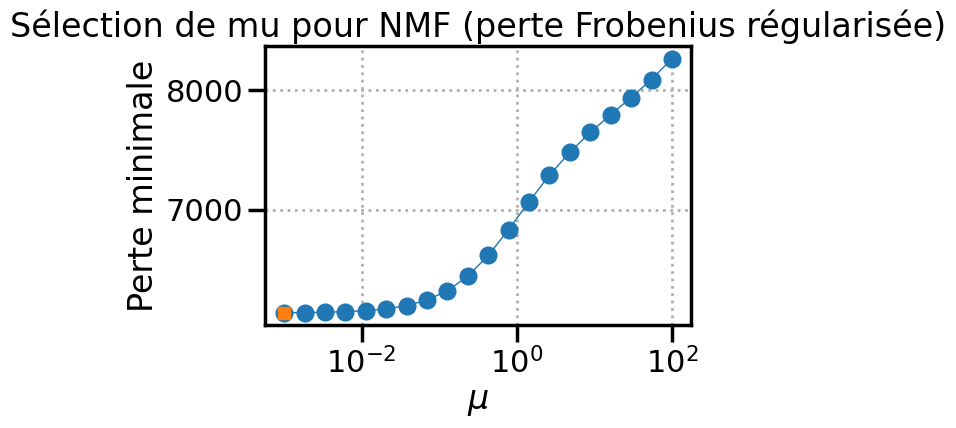

In [3]:
epochs    = 100
r         = 20
loss_type = "Frobenius"
mu_grid = np.logspace(-3, 2, 20)  # de 1e-3 à 1e2

losses = np.empty_like(mu_grid, dtype=float)

for i, mu in tqdm(enumerate(mu_grid)):
    # Modèle avec init reproductible pour comparer équitablement les μ
    opt = MYNMF(n_components=r, max_iter=epochs, loss=loss_type, random_state=0)
    opt.fit_transform(faces, mu=mu)  # ν et λ par défaut
    losses[i] = np.min(opt.loss_history)  # --- on retient la meilleure perte sur les itérations ---

# --- Sélection du meilleur μ ---
best_idx = int(np.argmin(losses))
best_mu  = mu_grid[best_idx]
best_loss = losses[best_idx]

# --- Visualisation (axe μ en log) ---
plt.figure()
plt.semilogx(mu_grid, losses, marker='o', linewidth=1)
plt.semilogx([best_mu], [best_loss], marker='s', markersize=8)  # point du meilleur μ
plt.xlabel(r'$\mu$')
plt.ylabel('Perte minimale')
plt.title(f'Sélection de mu pour NMF (perte {loss_type} régularisée)')
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()

print(f"Meilleur μ = {best_mu:.4g} avec perte minimale = {best_loss:.6f}")


Meilleur μ = 0.001 avec perte minimale = 6135.211140


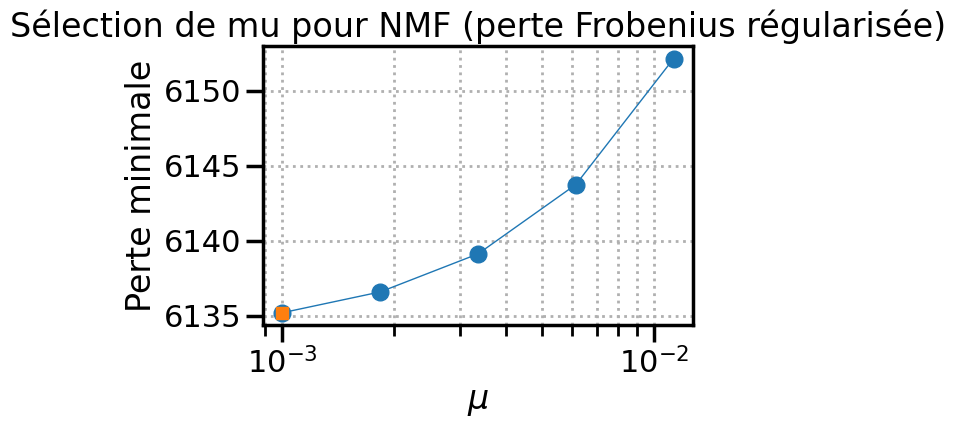

In [4]:
plt.figure()
plt.semilogx(mu_grid[:5], losses[:5], marker='o', linewidth=1)
plt.semilogx([best_mu], [best_loss], marker='s', markersize=8)  # point du meilleur μ
plt.xlabel(r'$\mu$')
plt.ylabel('Perte minimale')
plt.title(f'Sélection de mu pour NMF (perte {loss_type} régularisée)')
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()

print(f"Meilleur μ = {best_mu:.4g} avec perte minimale = {best_loss:.6f}")

### Regularization parameter : nu

20it [00:48,  2.41s/it]


Meilleur nu = 1e-05 avec perte minimale = 6140.939745


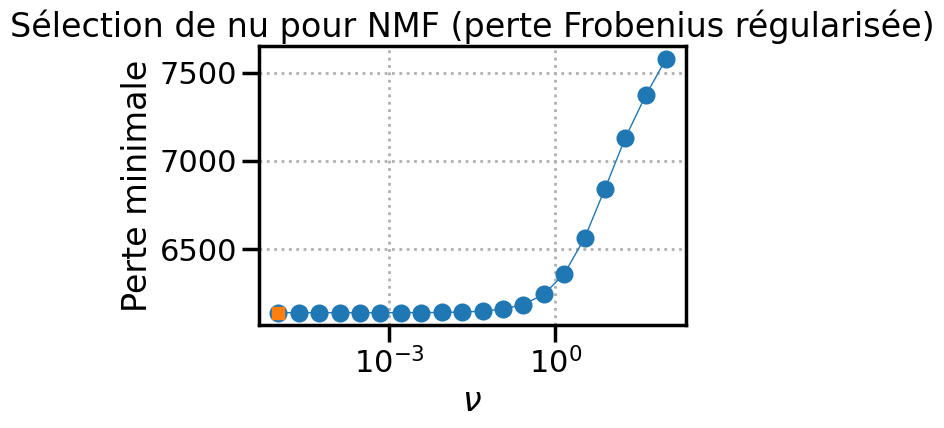

In [5]:
epochs    = 100
r         = 20
loss_type = "Frobenius"
nu_grid = np.logspace(-5, 2, 20)

losses = np.empty_like(nu_grid, dtype=float)

for i, nu in tqdm(enumerate(nu_grid)):
    # Modèle avec init reproductible pour comparer équitablement les μ
    opt = MYNMF(n_components=r, max_iter=epochs, loss=loss_type, random_state=0)
    opt.fit_transform(faces, nu=nu)  
    losses[i] = np.min(opt.loss_history)  # --- on retient la meilleure perte sur les itérations ---

# --- Sélection du meilleur μ ---
best_idx = int(np.argmin(losses))
best_nu  = nu_grid[best_idx]
best_loss = losses[best_idx]

# --- Visualisation (axe μ en log) ---
plt.figure()
plt.semilogx(nu_grid, losses, marker='o', linewidth=1)
plt.semilogx([best_nu], [best_loss], marker='s', markersize=8)  # point du meilleur μ
plt.xlabel(r'$\nu$')
plt.ylabel('Perte minimale')
plt.title(f'Sélection de nu pour NMF (perte {loss_type} régularisée)')
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()

print(f"Meilleur nu = {best_nu:.4g} avec perte minimale = {best_loss:.6f}")


Meilleur nu = 1e-05 avec perte minimale = 6140.939745


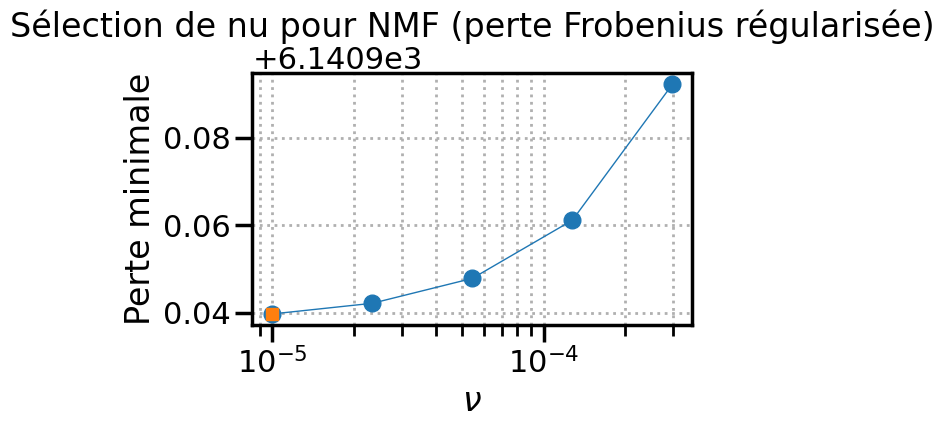

In [6]:
# --- Visualisation (axe μ en log) ---
plt.figure()
plt.semilogx(nu_grid[:5], losses[:5], marker='o', linewidth=1)
plt.semilogx([best_nu], [best_loss], marker='s', markersize=8)  # point du meilleur μ
plt.xlabel(r'$\nu$')
plt.ylabel('Perte minimale')
plt.title(f'Sélection de nu pour NMF (perte {loss_type} régularisée)')
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()

print(f"Meilleur nu = {best_nu:.4g} avec perte minimale = {best_loss:.6f}")

### Regularization parameter : lambda

20it [00:46,  2.35s/it]


Meilleur lambda = 1e-05 avec perte minimale = 6137.824910


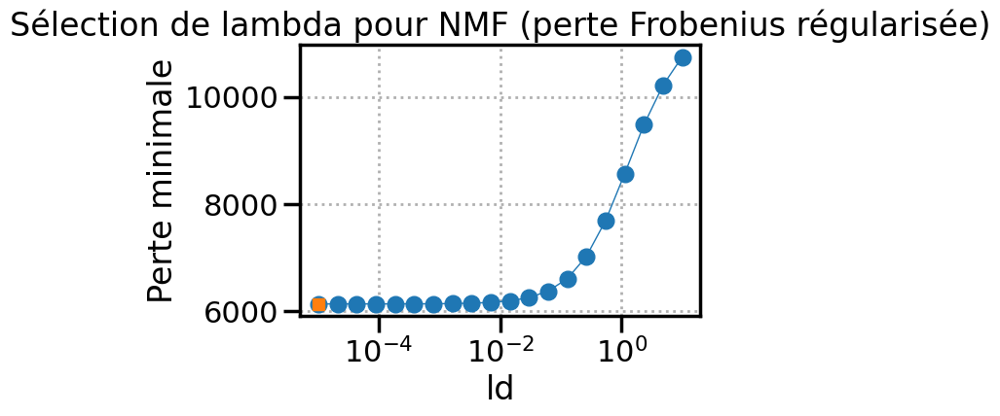

In [7]:
#TODO : find best lambda
epochs    = 100
r         = 20
loss_type = "Frobenius"
ld_grid = np.logspace(-5, 1, 20)  # de 1e-3 à 1e2

losses = np.empty_like(ld_grid, dtype=float)

for i, ld in tqdm(enumerate(ld_grid)):
    # Modèle avec init reproductible pour comparer équitablement les μ
    opt = MYNMF(n_components=r, max_iter=epochs, loss=loss_type, random_state=0)
    opt.fit_transform(faces, lambd=ld)  # ν et λ par défaut
    losses[i] = np.min(opt.loss_history)  # --- on retient la meilleure perte sur les itérations ---

# --- Sélection du meilleur μ ---
best_idx = int(np.argmin(losses))
best_ld  = ld_grid[best_idx]
best_loss = losses[best_idx]

# --- Visualisation (axe μ en log) ---
plt.figure()
plt.semilogx(ld_grid, losses, marker='o', linewidth=1)
plt.semilogx([best_ld], [best_loss], marker='s', markersize=8)  # point du meilleur μ
plt.xlabel('ld')
plt.ylabel('Perte minimale')
plt.title(f'Sélection de lambda pour NMF (perte {loss_type} régularisée)')
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()

print(f"Meilleur lambda = {best_ld:.4g} avec perte minimale = {best_loss:.6f}")


Meilleur lambda = 1e-05 avec perte minimale = 6137.824910


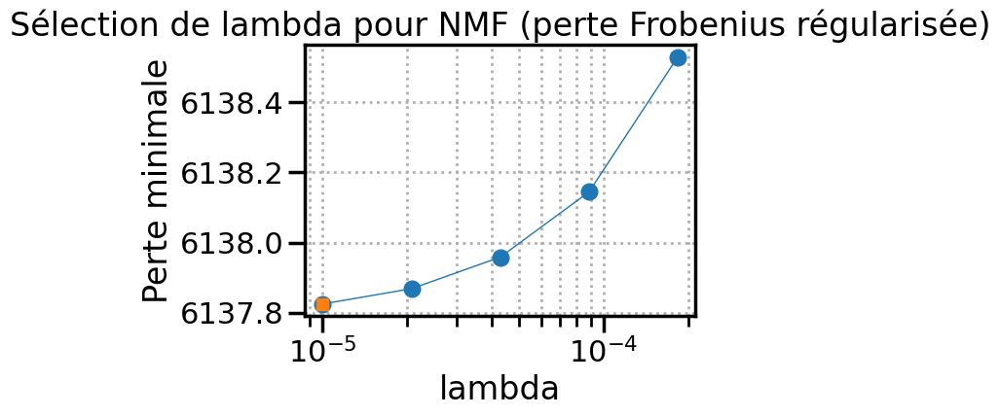

In [8]:
plt.figure()
plt.semilogx(ld_grid[:5], losses[:5], marker='o', linewidth=1)
plt.semilogx([best_ld], [best_loss], marker='s', markersize=8)  # point du meilleur μ
plt.xlabel('lambda')
plt.ylabel('Perte minimale')
plt.title(f'Sélection de lambda pour NMF (perte {loss_type} régularisée)')
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()

print(f"Meilleur lambda = {best_ld:.4g} avec perte minimale = {best_loss:.6f}")

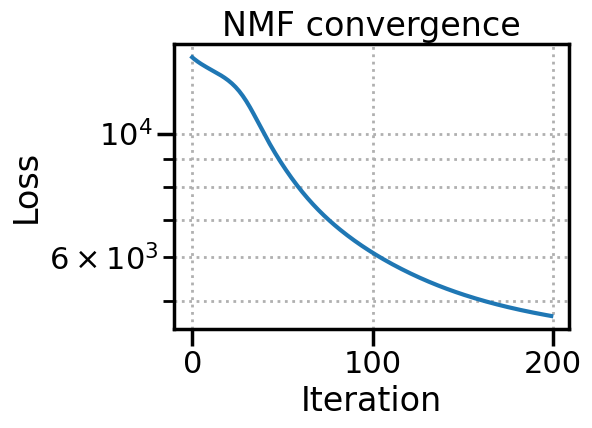

In [9]:
#TODO : check results for mu, nu and lambda with new obtained regularization parameters

best_opt = MYNMF(n_components=r, max_iter=200, loss=loss_type, random_state=0)
best_opt.fit_transform(faces, lambd=best_ld, mu=best_mu, nu=best_nu)

plt.semilogy(best_opt.loss_history)
plt.xlabel("Iteration"); plt.ylabel("Loss")
plt.title(f"NMF convergence")
plt.grid(True, which="both", linestyle=":")
plt.tight_layout()



### Number of components

We are going to determine the **optimal number of components** for the factorization by plotting the final loss after 100 epochs for different number of components.
We expect an **elbow curve**, and we will choose the value at the elbow point. Indeed, the higher the number of components is, the more precise the atoms of the dictionary can be, and thus the more precise the reconstructed image will be.
We will find the optimal parameter both for Frobenius and Kullback-Leibler distances.

#### Case of Frobenius distance

10it [00:44,  4.45s/it]


Meilleur r = 200 avec perte minimale = 3851.490814


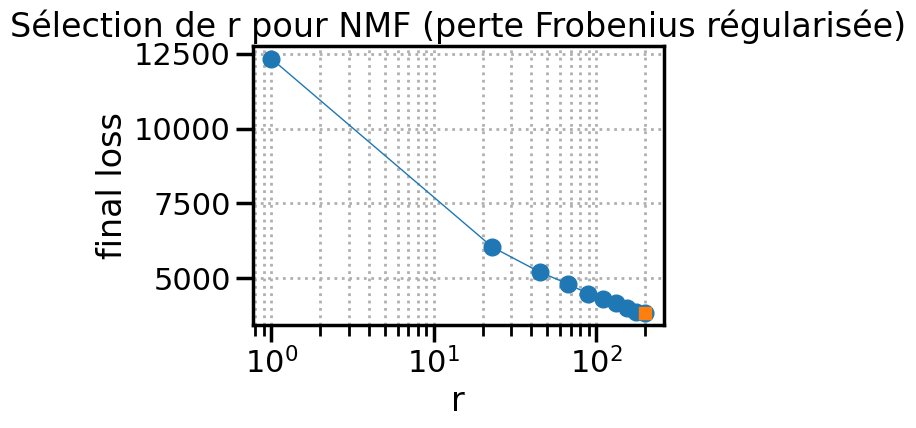

In [10]:
#TODO
epochs    = 100
grid_size = 10
r_grid = np.linspace(1, 200, grid_size, dtype=int)  

image_to_compare = 3

loss_type = "Frobenius"

saved_photos_reconstruction_Fr = np.zeros((grid_size,64,64))

losses = np.empty_like(r_grid, dtype=float)

for i, r in tqdm(enumerate(r_grid)):
    # Modèle avec init reproductible pour comparer équitablement les r
    opt = MYNMF(n_components=r, max_iter=epochs, loss=loss_type, random_state=0)
    opt.fit_transform(faces)  
    losses[i] = opt.loss_history[-1] 
    saved_photos_reconstruction_Fr[i] = (opt.D_@opt.S_)[:,image_to_compare].reshape(64,-1)
    

# --- Sélection du meilleur r ---
best_idx = int(np.argmin(losses))
best_r  = r_grid[best_idx]
best_loss = losses[best_idx]

# --- Visualisation (axe μ en log) ---
plt.figure()
plt.semilogx(r_grid, losses, marker='o', linewidth=1)
plt.semilogx([best_r], [best_loss], marker='s', markersize=8)  # point du meilleur μ
plt.xlabel("r")
plt.ylabel('final loss')
plt.title(f'Sélection de r pour NMF (perte {loss_type} régularisée)')
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()

print(f"Meilleur r = {best_r:.4g} avec perte minimale = {best_loss:.6f}")


#### Case of Kullback-Leibler divergence

10it [02:29, 15.00s/it]


Meilleur r = 1e-05 avec perte minimale = 7559.197626


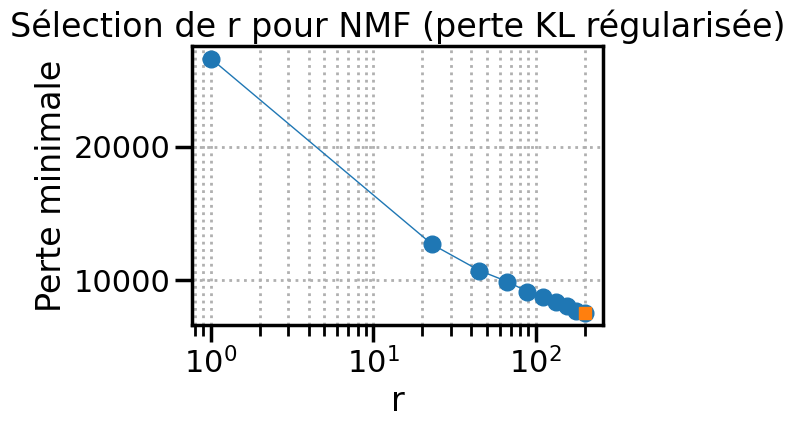

In [11]:
#TODO
#TODO
epochs    = 100
r_grid = np.linspace(1, 200, 10, dtype=int)  

loss_type = "KL"


saved_photos_reconstruction_KL = np.zeros((grid_size,64,64))

for i, r in tqdm(enumerate(r_grid)):
    # Modèle avec init reproductible pour comparer équitablement les r
    opt = MYNMF(n_components=r, max_iter=epochs, loss=loss_type, random_state=0)
    opt.fit_transform(faces)  
    losses[i] = opt.loss_history[-1]  
    saved_photos_reconstruction_KL[i] = (opt.D_@opt.S_)[:,image_to_compare].reshape(64,-1)

# --- Sélection du meilleur r ---
best_idx = int(np.argmin(losses))
best_r  = r_grid[best_idx]
best_loss = losses[best_idx]

# --- Visualisation (axe μ en log) ---
plt.figure()
plt.semilogx(r_grid, losses, marker='o', linewidth=1)
plt.semilogx([best_r], [best_loss], marker='s', markersize=8)  # point du meilleur μ
plt.xlabel("r")
plt.ylabel('Perte minimale')
plt.title(f'Sélection de r pour NMF (perte {loss_type} régularisée)')
plt.grid(True, which='both', linestyle=':')
plt.tight_layout()

print(f"Meilleur r = {best_nu:.4g} avec perte minimale = {best_loss:.6f}")


## Model training

### Training with Frobenius distance for different number of components

Fitting NMF across r: 100%|██████████| 11/11 [00:30<00:00,  2.81s/it]


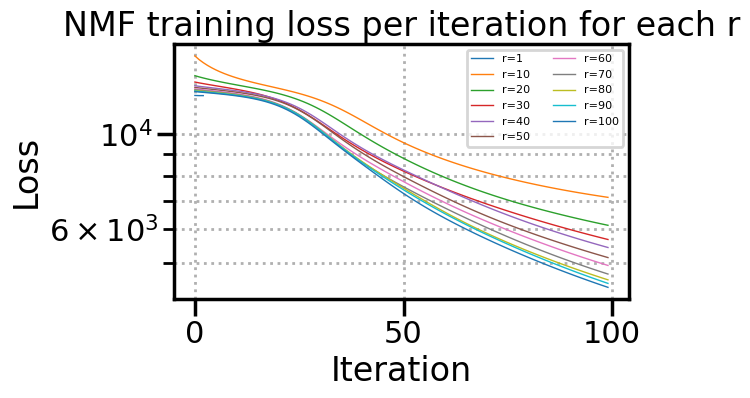

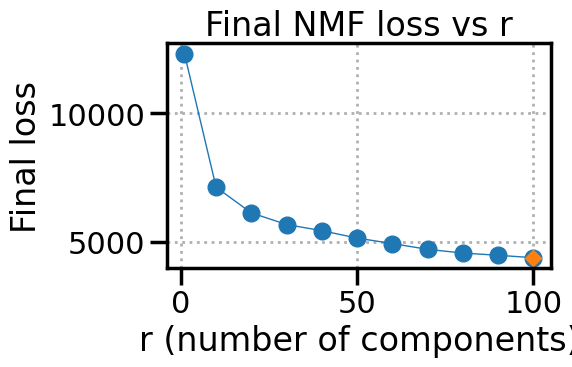

Best r (min final loss): 100  |  loss = 4388.266295


In [12]:
#TODO : Train different models for different number of components with Frobenius loss and plot loss function 

r_grid = np.linspace(1, 100, 11, dtype=int)

# Keep track of loss curves and final losses per r
losses_by_r = {}
final_loss_per_r = []

plt.figure(figsize=(7, 4.5))
for r in tqdm(r_grid, desc="Fitting NMF across r"):
    opt = MYNMF(n_components=r, max_iter=epochs, loss="Frobenius", random_state=0)
    # Keep your hyperparameters exactly as-is
    opt.fit_transform(faces, lambd=best_ld, mu=best_mu, nu=best_nu)

    # Robustly convert to numpy array
    loss_curve = np.asarray(opt.loss_history, dtype=float)
    losses_by_r[r] = loss_curve
    final_loss_per_r.append(loss_curve[-1] if loss_curve.size else np.nan)

    # Plot learning curve for this r (semilogy often clearer for losses)
    plt.semilogy(loss_curve, label=f"r={r}", linewidth=1)

# Beautify the loss-curve figure
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("NMF training loss per iteration for each r")
plt.grid(True, which="both", linestyle=":")
plt.legend(ncol=2, fontsize=8)
plt.tight_layout()
plt.show()

# Optional: visualize final loss vs r to see the trade-off
final_loss_per_r = np.asarray(final_loss_per_r, dtype=float)
best_idx = int(np.nanargmin(final_loss_per_r))
best_r = r_grid[best_idx]

plt.figure(figsize=(6.2, 4.2))
plt.plot(r_grid, final_loss_per_r, marker="o", linewidth=1)
plt.plot([best_r], [final_loss_per_r[best_idx]], marker="D", markersize=8)
plt.xlabel("r (number of components)")
plt.ylabel("Final loss")
plt.title("Final NMF loss vs r")
plt.grid(True, linestyle=":")
plt.tight_layout()
plt.show()

print(f"Best r (min final loss): {best_r}  |  loss = {final_loss_per_r[best_idx]:.6f}")


### Training with KL-divergence for different number of components

Fitting NMF across r: 100%|██████████| 11/11 [02:01<00:00, 11.06s/it]


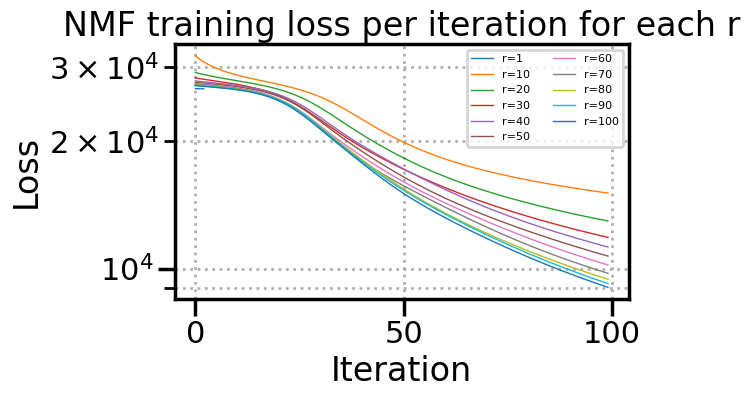

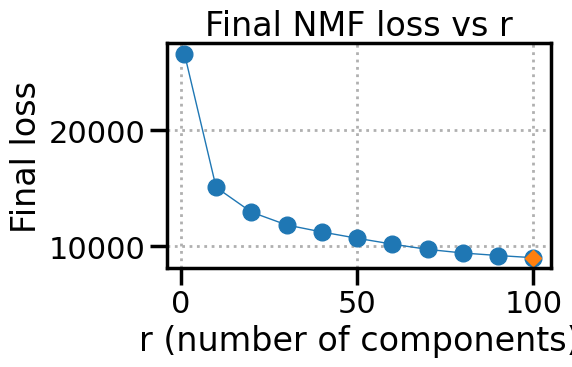

Best r (min final loss): 100  |  loss = 9025.993709


In [13]:
#TODO : Train different models for different number of components with KL divergence and plot loss function 

r_grid = np.linspace(1, 100, 11, dtype=int)

# Keep track of loss curves and final losses per r
losses_by_r = {}
final_loss_per_r = []

plt.figure(figsize=(7, 4.5))
for r in tqdm(r_grid, desc="Fitting NMF across r"):
    opt = MYNMF(n_components=r, max_iter=epochs, loss="KL", random_state=0)
    # Keep your hyperparameters exactly as-is
    opt.fit_transform(faces, lambd=best_ld, mu=best_mu, nu=best_nu)

    # Robustly convert to numpy array
    loss_curve = np.asarray(opt.loss_history, dtype=float)
    losses_by_r[r] = loss_curve
    final_loss_per_r.append(loss_curve[-1] if loss_curve.size else np.nan)

    # Plot learning curve for this r (semilogy often clearer for losses)
    plt.semilogy(loss_curve, label=f"r={r}", linewidth=1)

# Beautify the loss-curve figure
plt.xlabel("Iteration")
plt.ylabel("Loss")
plt.title("NMF training loss per iteration for each r")
plt.grid(True, which="both", linestyle=":")
plt.legend(ncol=2, fontsize=8)
plt.tight_layout()
plt.show()

# Optional: visualize final loss vs r to see the trade-off
final_loss_per_r = np.asarray(final_loss_per_r, dtype=float)
best_idx = int(np.nanargmin(final_loss_per_r))
best_r = r_grid[best_idx]

plt.figure(figsize=(6.2, 4.2))
plt.plot(r_grid, final_loss_per_r, marker="o", linewidth=1)
plt.plot([best_r], [final_loss_per_r[best_idx]], marker="D", markersize=8)
plt.xlabel("r (number of components)")
plt.ylabel("Final loss")
plt.title("Final NMF loss vs r")
plt.grid(True, linestyle=":")
plt.tight_layout()
plt.show()

print(f"Best r (min final loss): {best_r}  |  loss = {final_loss_per_r[best_idx]:.6f}")


## Applications

### First application

For the first application you are going to analyse the following data to give an interpretation of the factorization:

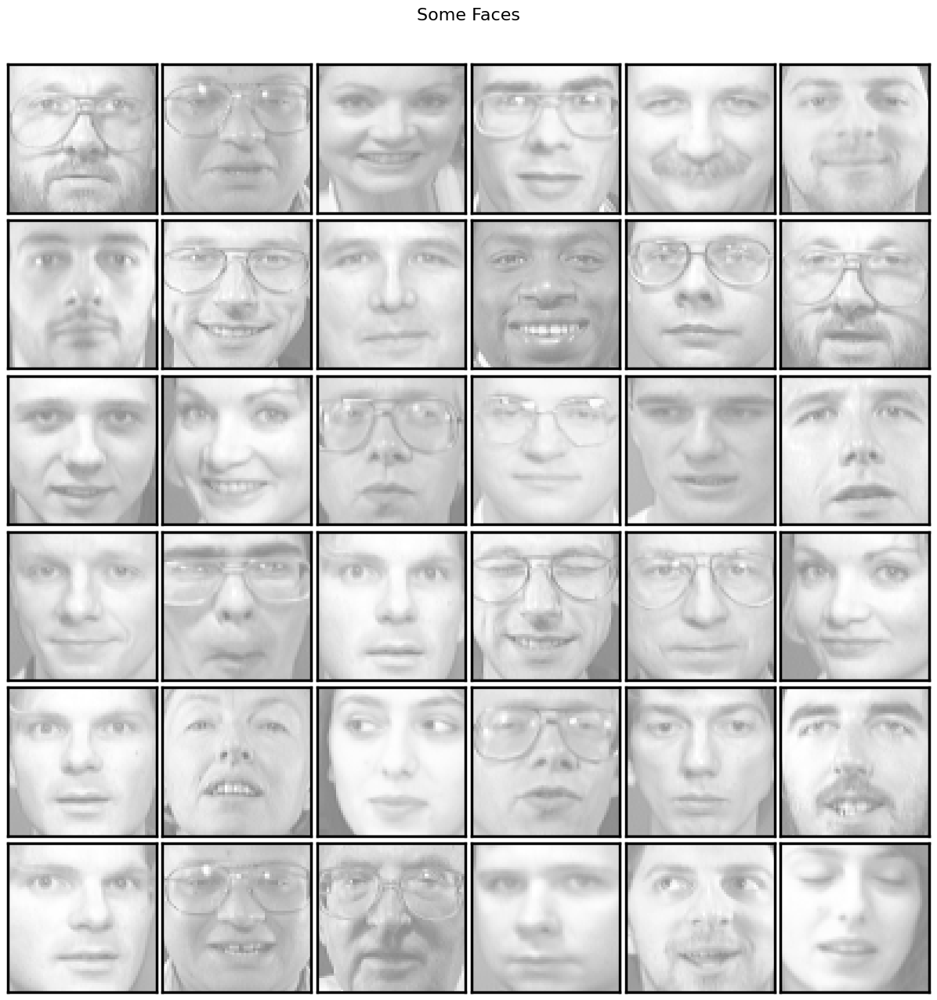

In [14]:
faces = faces.T  
image_shape = (64, 64)
n_samples, n_features = faces.shape

# global centering
faces_centered = faces - faces.mean(axis=0)

# local centering
faces_centered -= faces_centered.mean(axis=1).reshape(n_samples, -1)

def plot_gallery(images, image_shape, nrow, ncol, title='', cmap=plt.cm.gray):
    
    # fit the nb of images into a square
    n_images = len(images)
    nrows = nrow
    ncols = ncol
    
    # instantiate figure
    fig, axes = plt.subplots(nrows, ncols, figsize=(2. * ncols, 2.26 * nrows))
    fig.suptitle(title, size=16)
    
    axes_for_display = axes.flatten()[:n_images]
    axes_to_blank = axes.flatten()[n_images:]
    
    for idx, comp in enumerate(images):
        ax = axes_for_display[idx]
        vmax = max(comp.max(), -comp.min())
        ax.imshow(comp.reshape(image_shape), cmap=cmap,
                   interpolation='nearest',
                   vmin=-vmax, vmax=vmax)
        ax.set(xticks=(),
               yticks=())
        
    for ax in axes_to_blank:
        ax.axis('off')

    fig.tight_layout()
    fig.subplots_adjust(0.01, 0.05, 0.99, 0.93, 0.04, 0.)  # insert space below the suptitle
    
plot_gallery(title="Some Faces", 
             images=faces[:36], 
             image_shape=image_shape,nrow=6,ncol=6)


### Analysis of the number of components on the reconstruction

#### Reconstruction with Frobenius distance

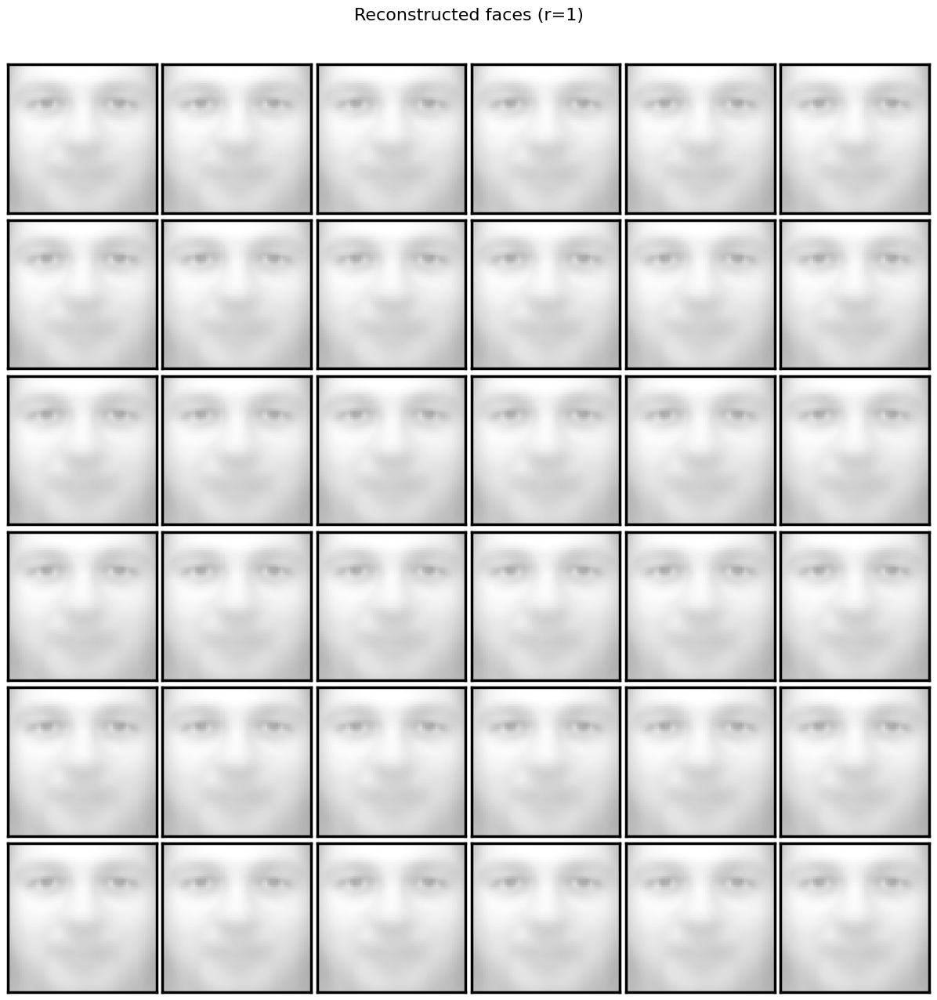

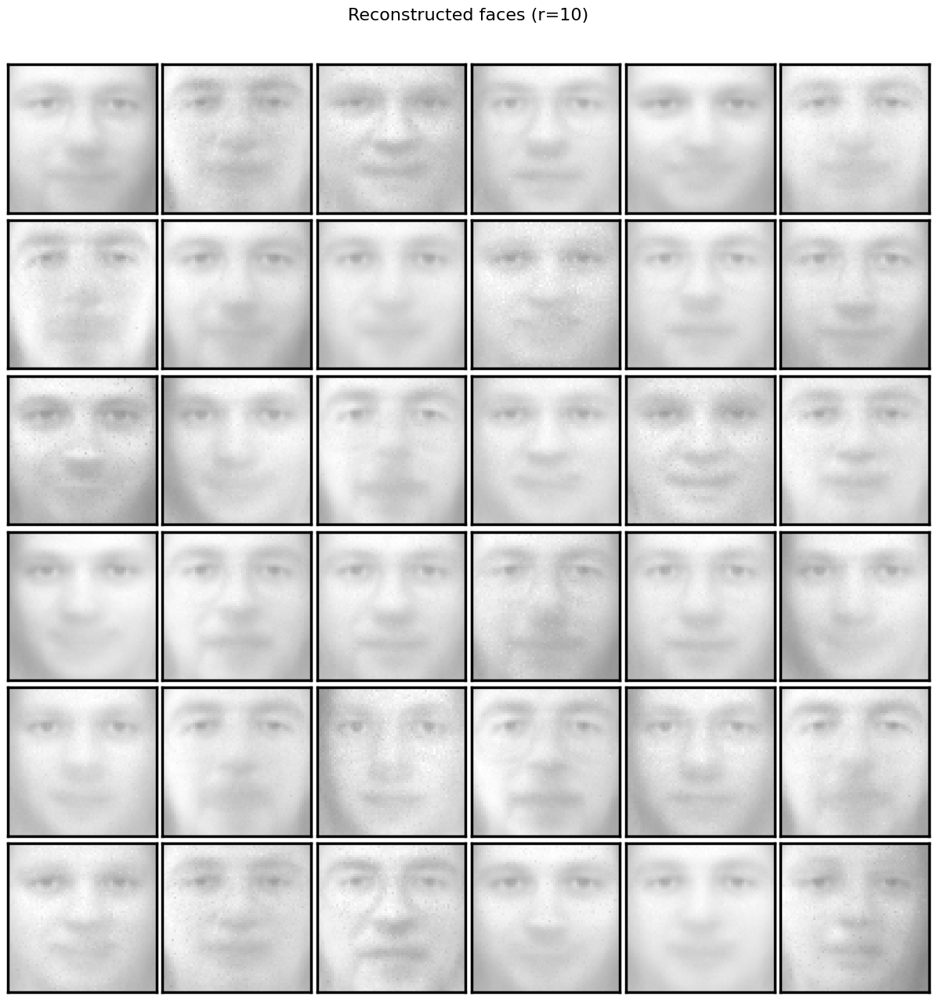

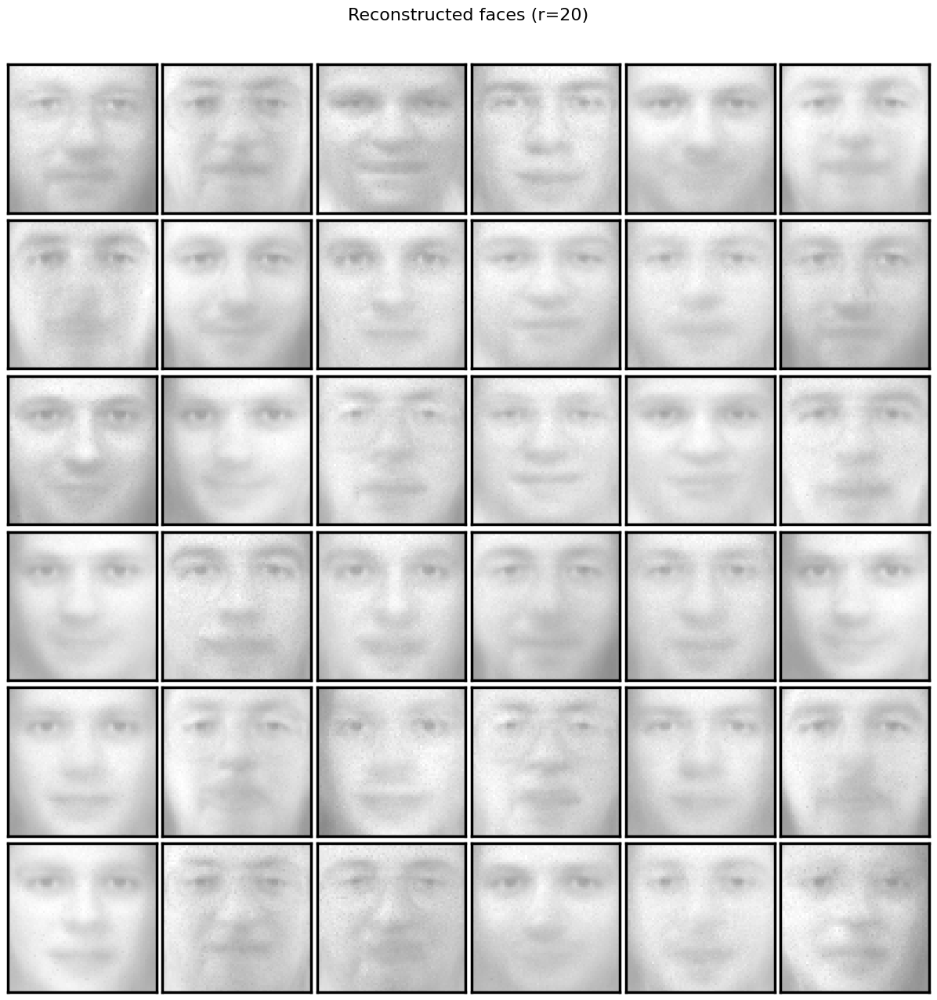

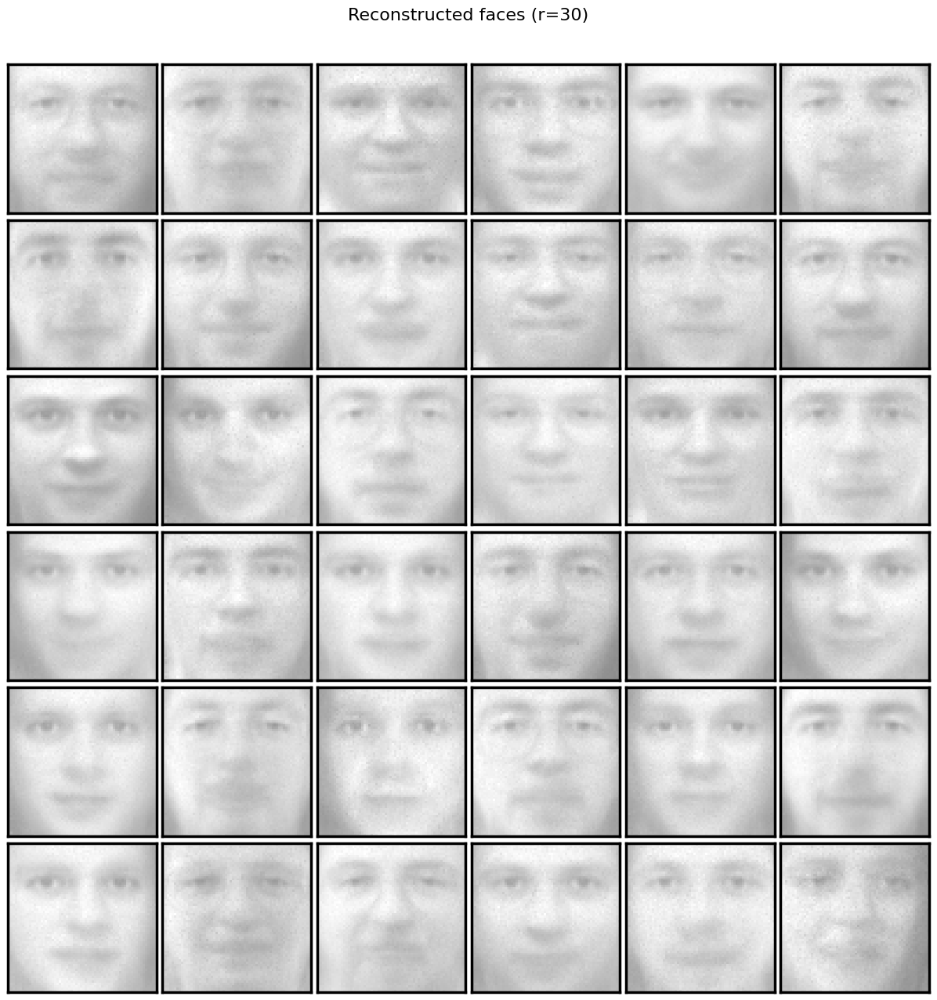

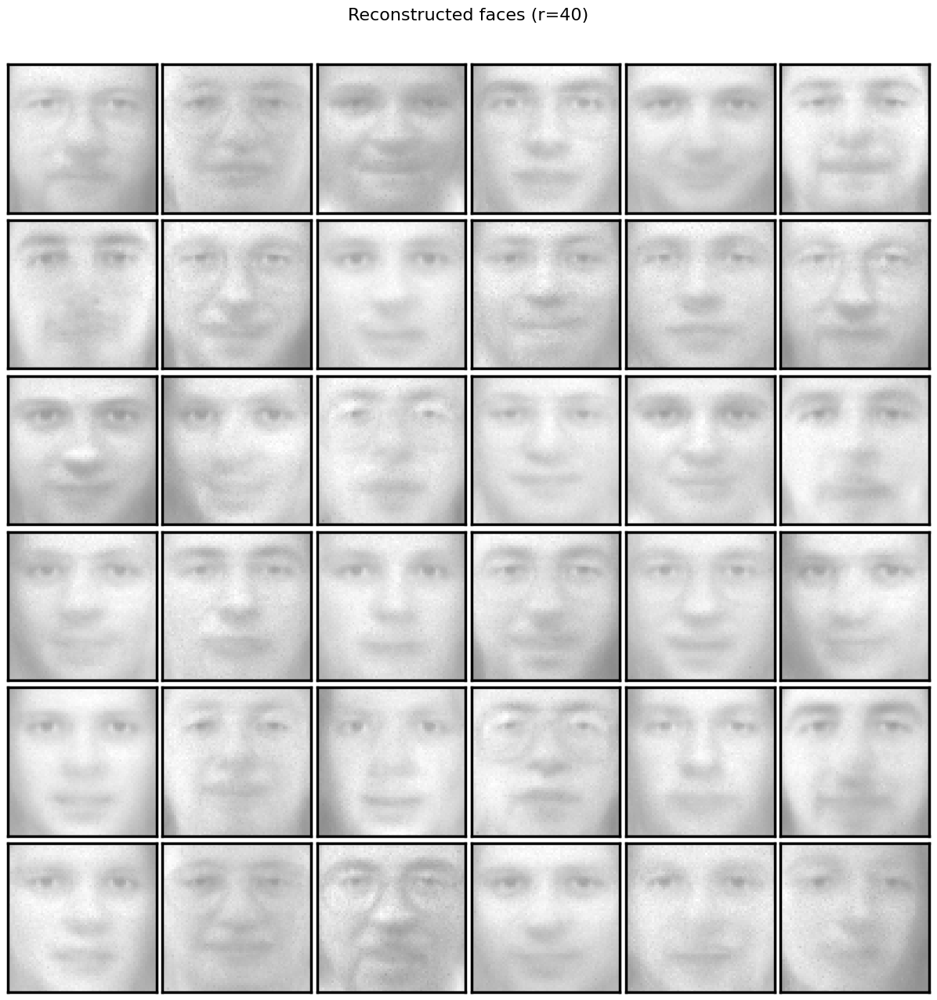

...

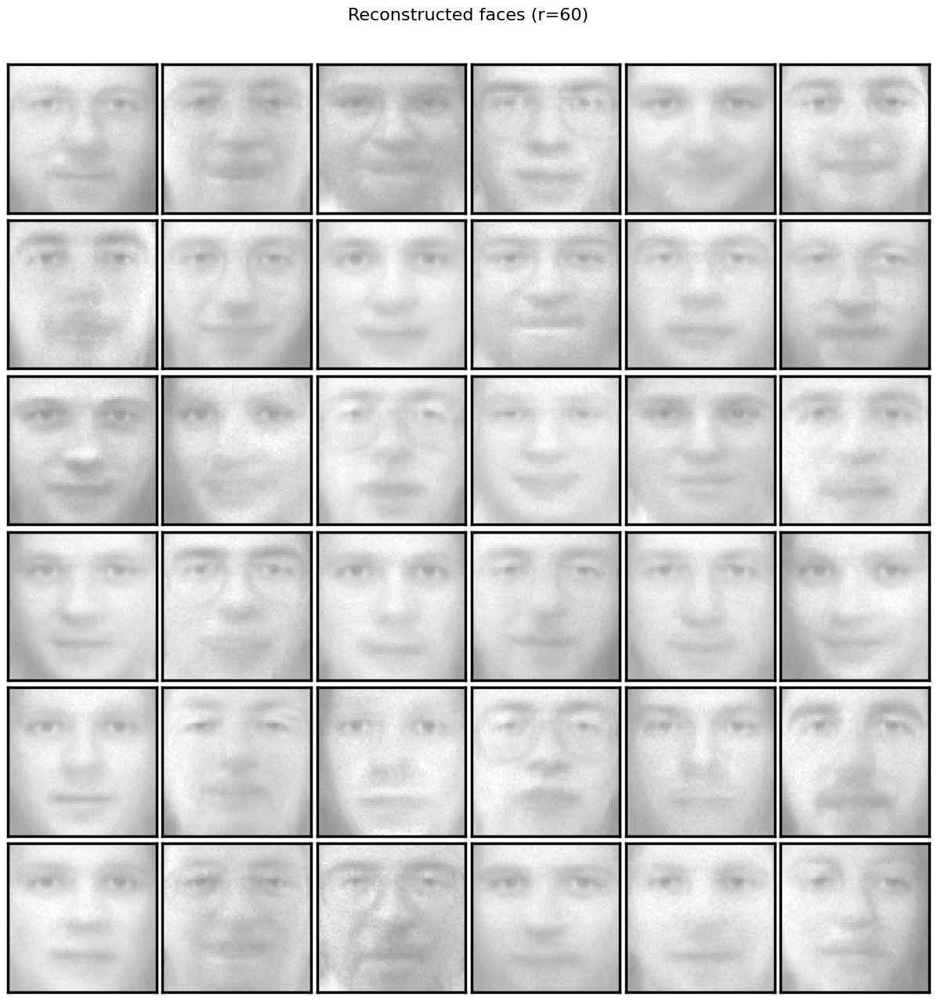

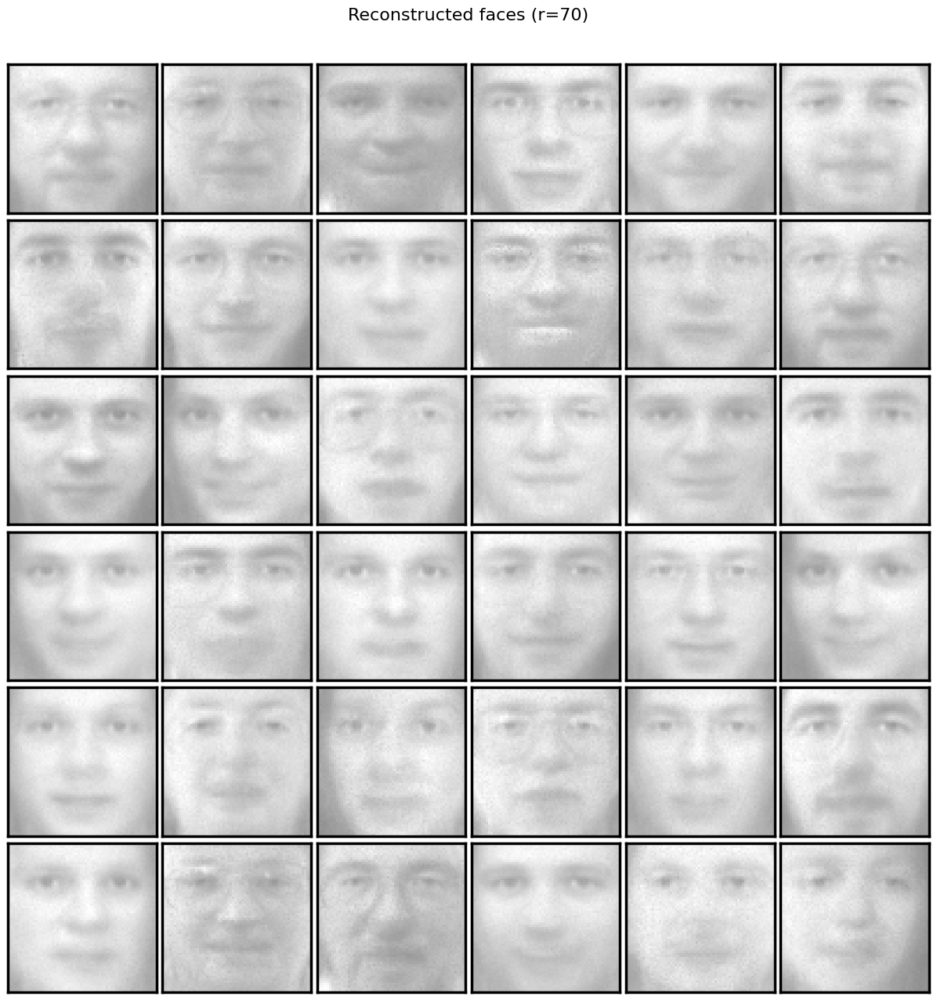

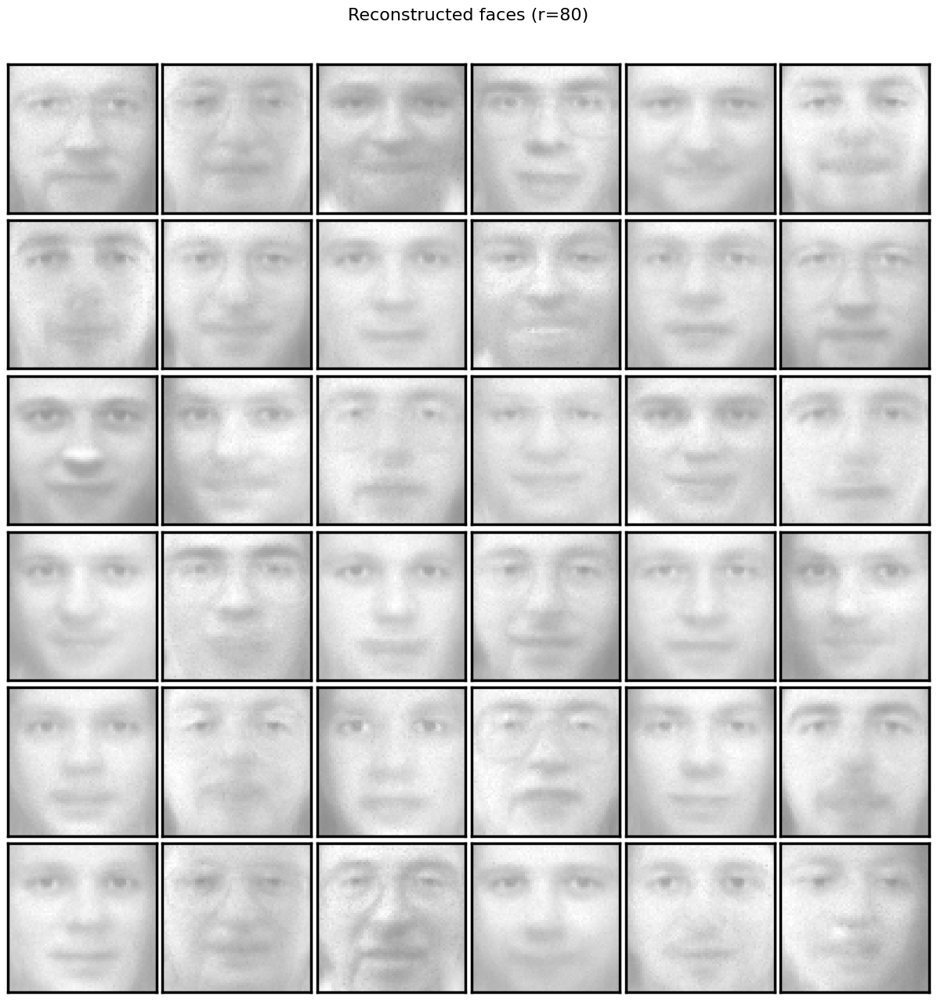

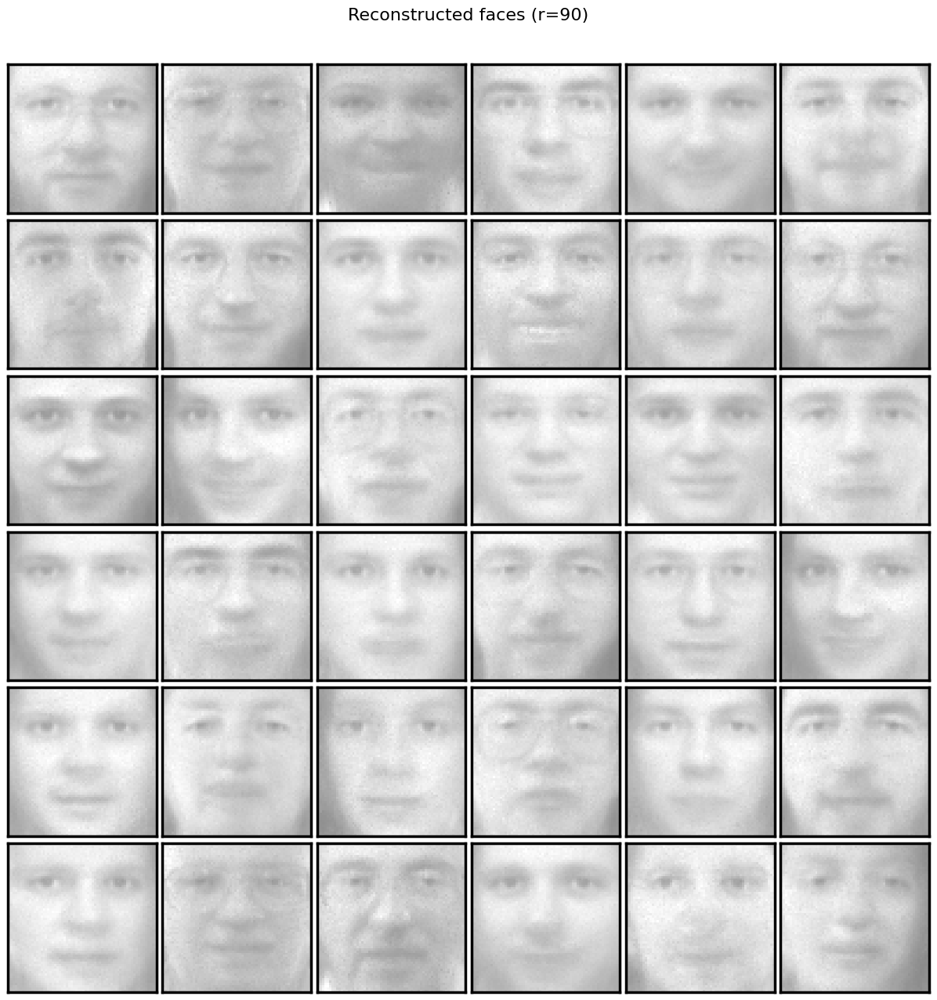

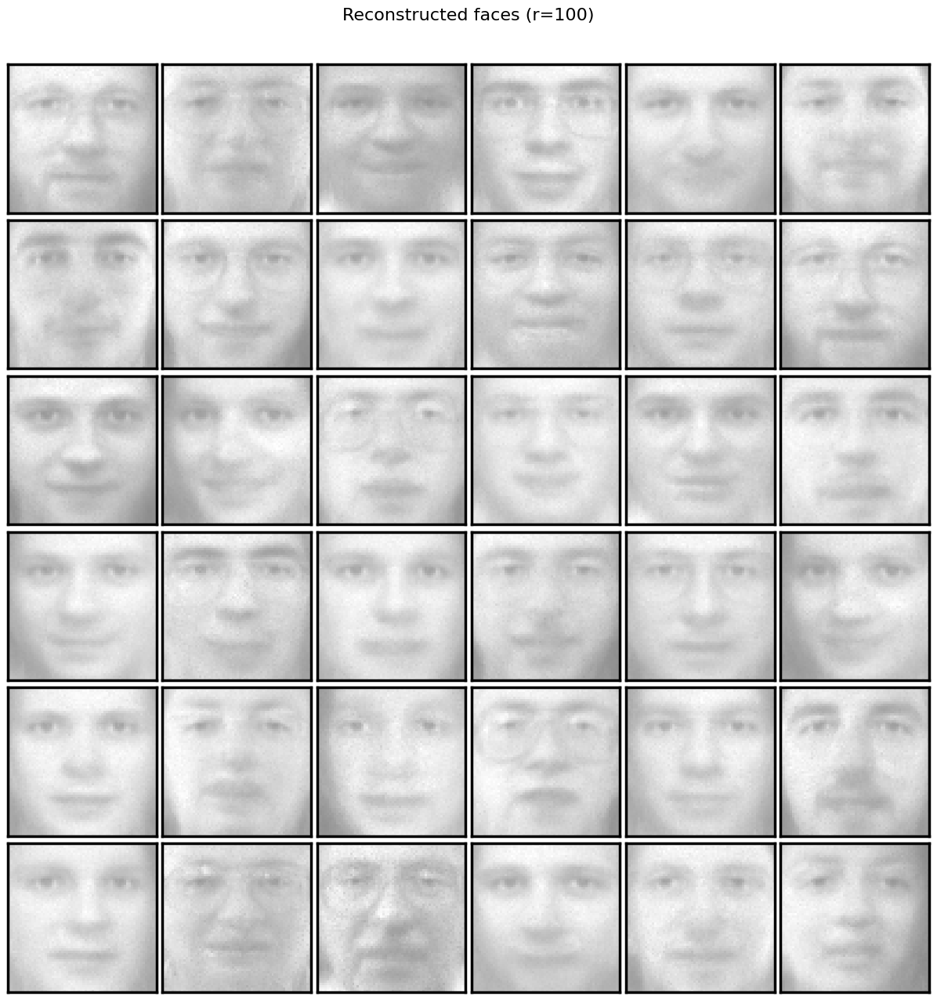

In [15]:
#TODO : plot reconstructed faces for different number of components with Frobenius distance

epochs = 100
r_grid = np.linspace(1, 100, 11, dtype=int) 

for r in r_grid :
    opt = MYNMF(n_components=r, max_iter=epochs, loss="Frobenius")
    # IMPORTANT : on entraîne sur `faces` (non centrées) pour rester non négatif
    opt.fit_transform(faces,lambd=best_ld, mu=best_mu, nu=best_nu)
    generated_faces = opt.D_ @ opt.S_
    

    plot_gallery(
        images=generated_faces[:36],                         
        image_shape=image_shape,
        nrow=6, ncol=6,
        title=f"Reconstructed faces (r={r})",
        cmap=plt.cm.gray
    )


#### Reconstruction with Kullback-Leibler divergence

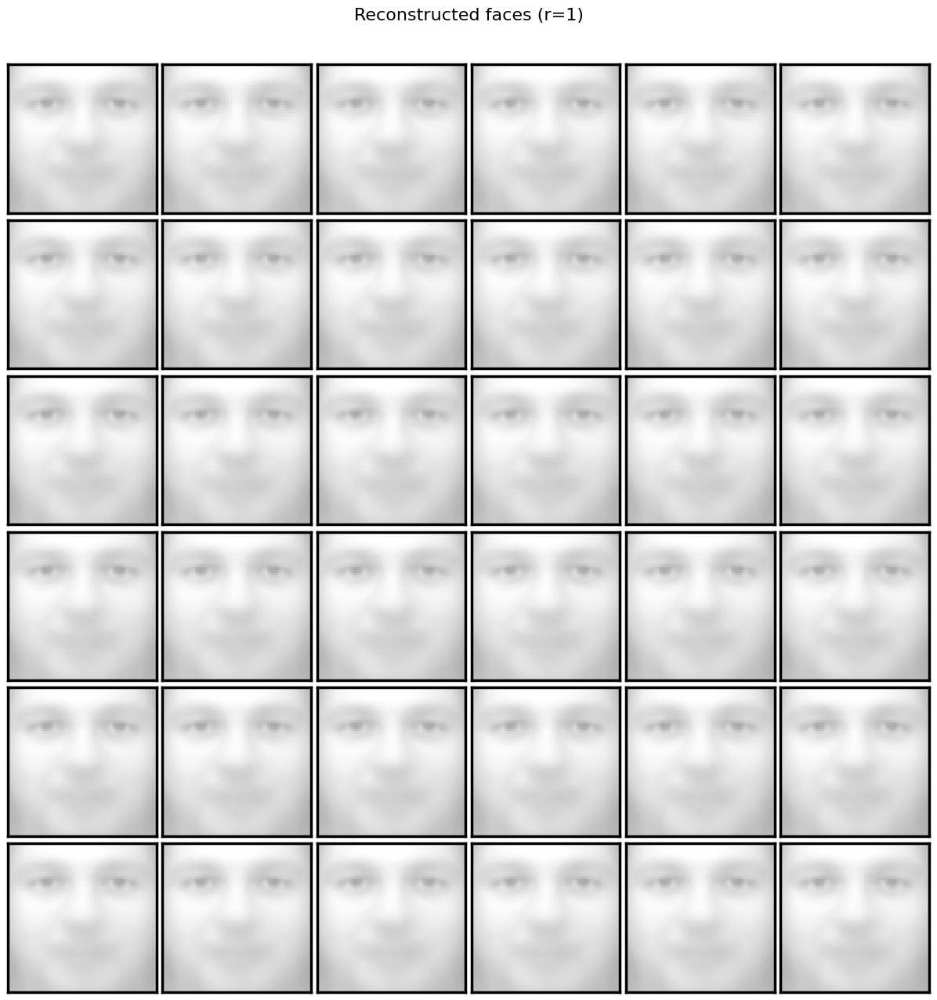

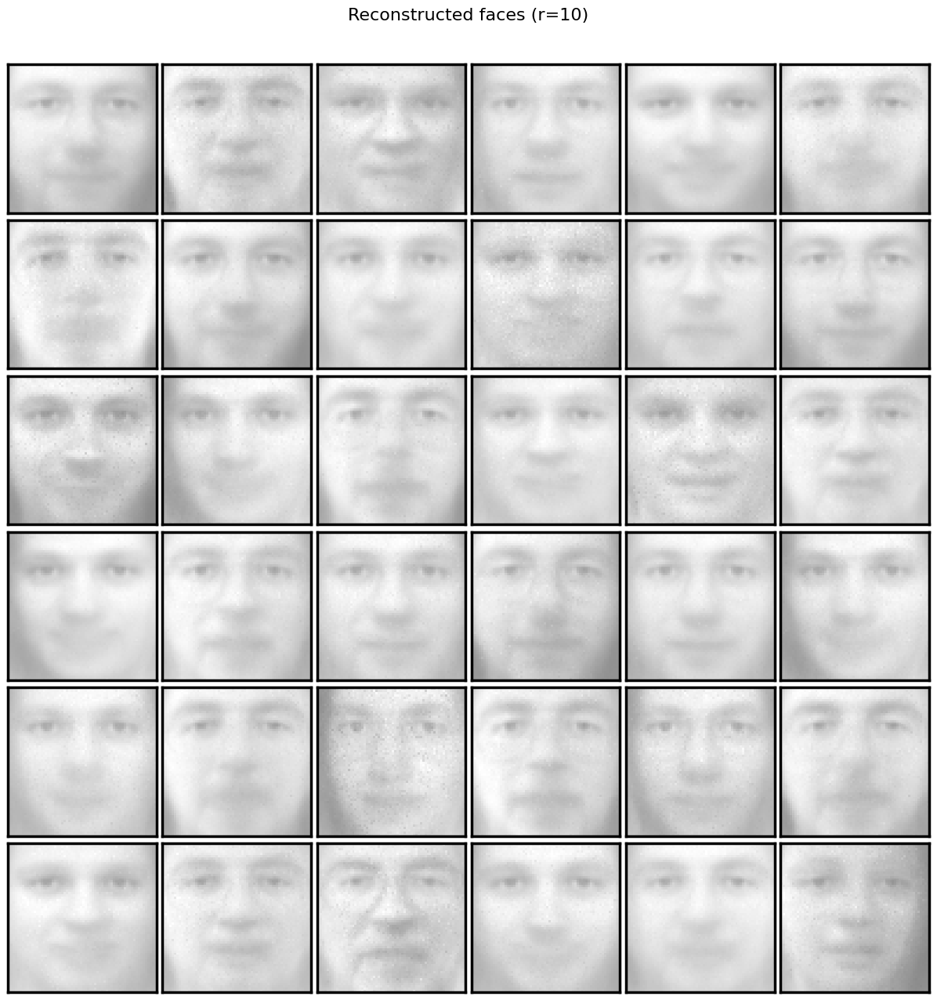

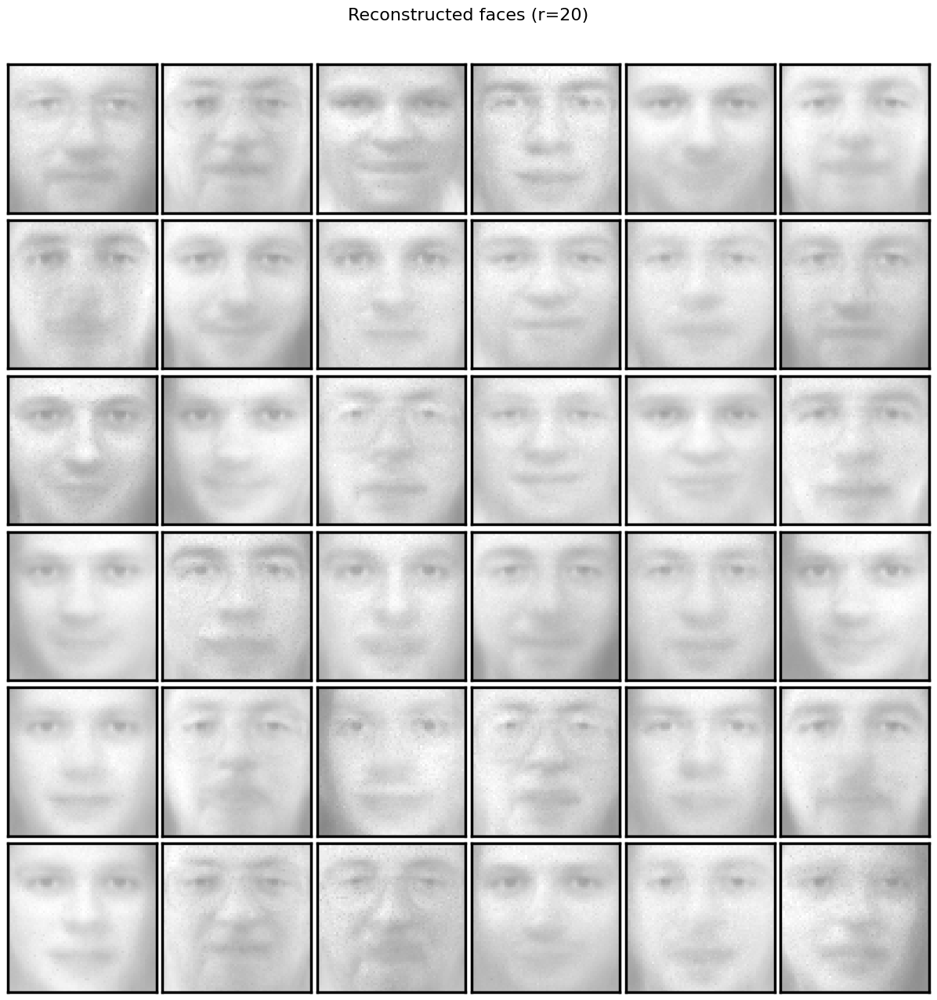

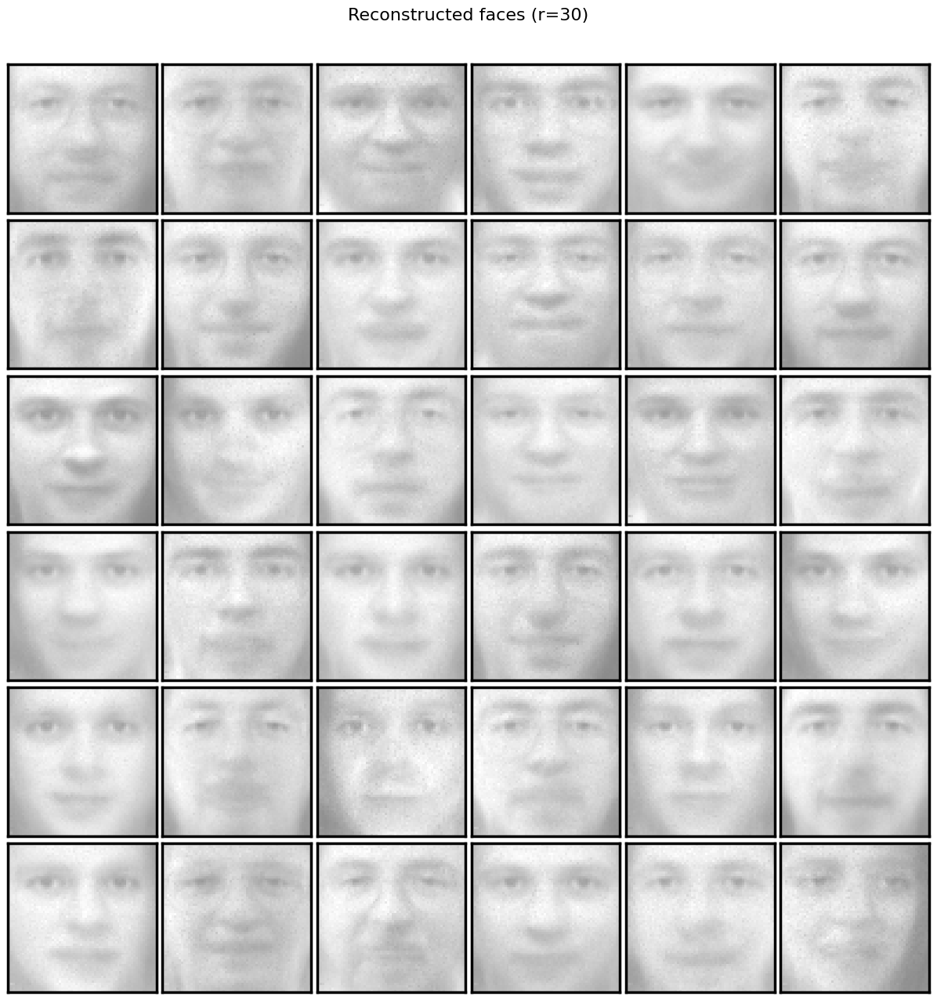

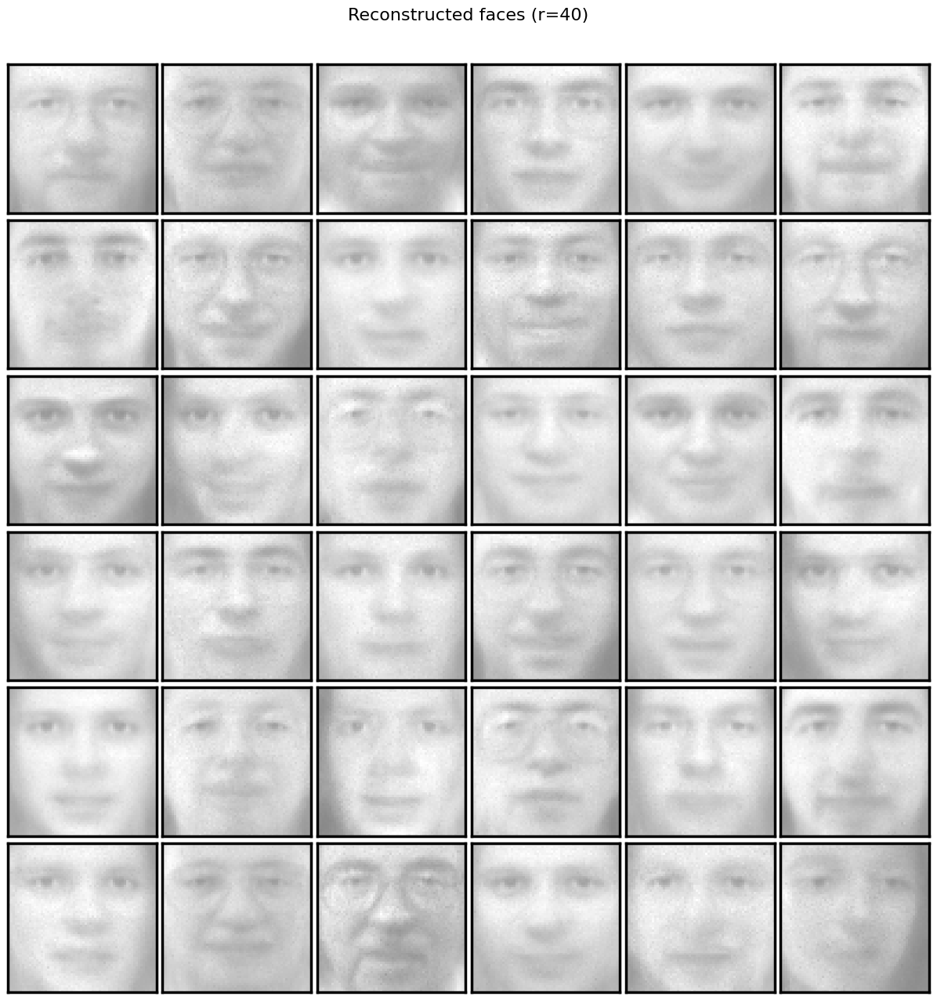

...

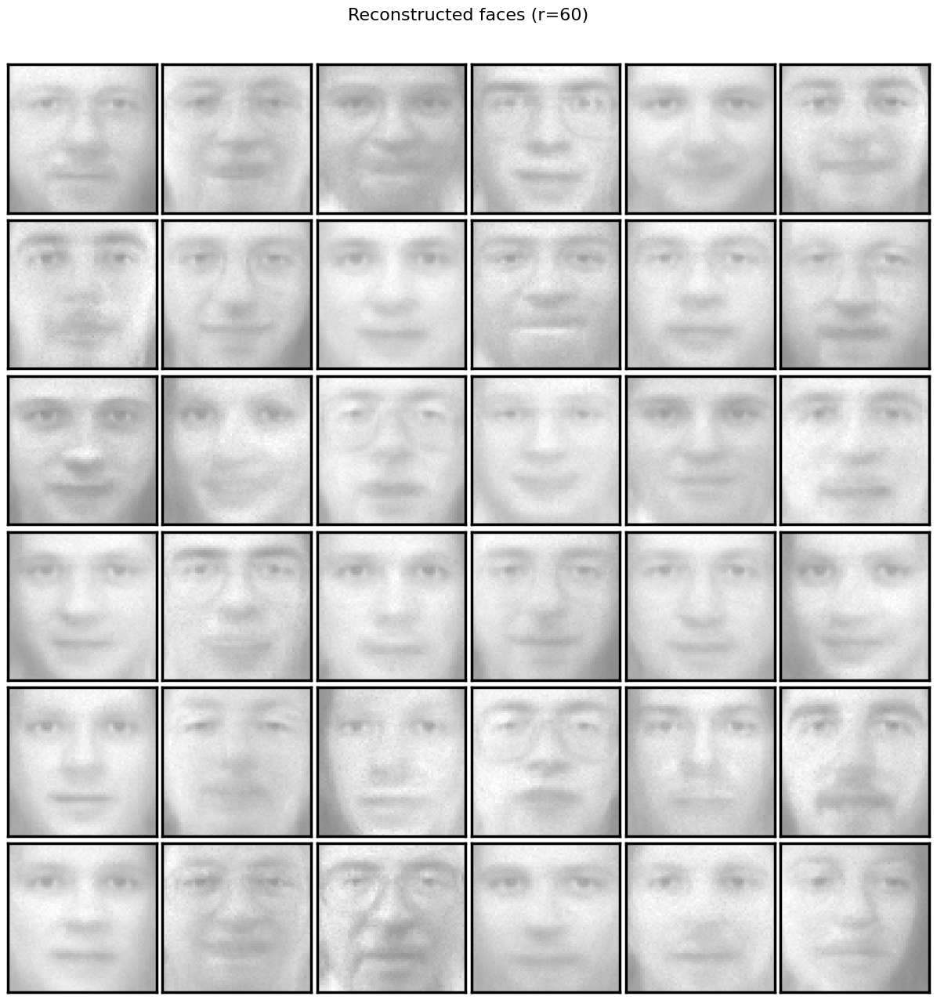

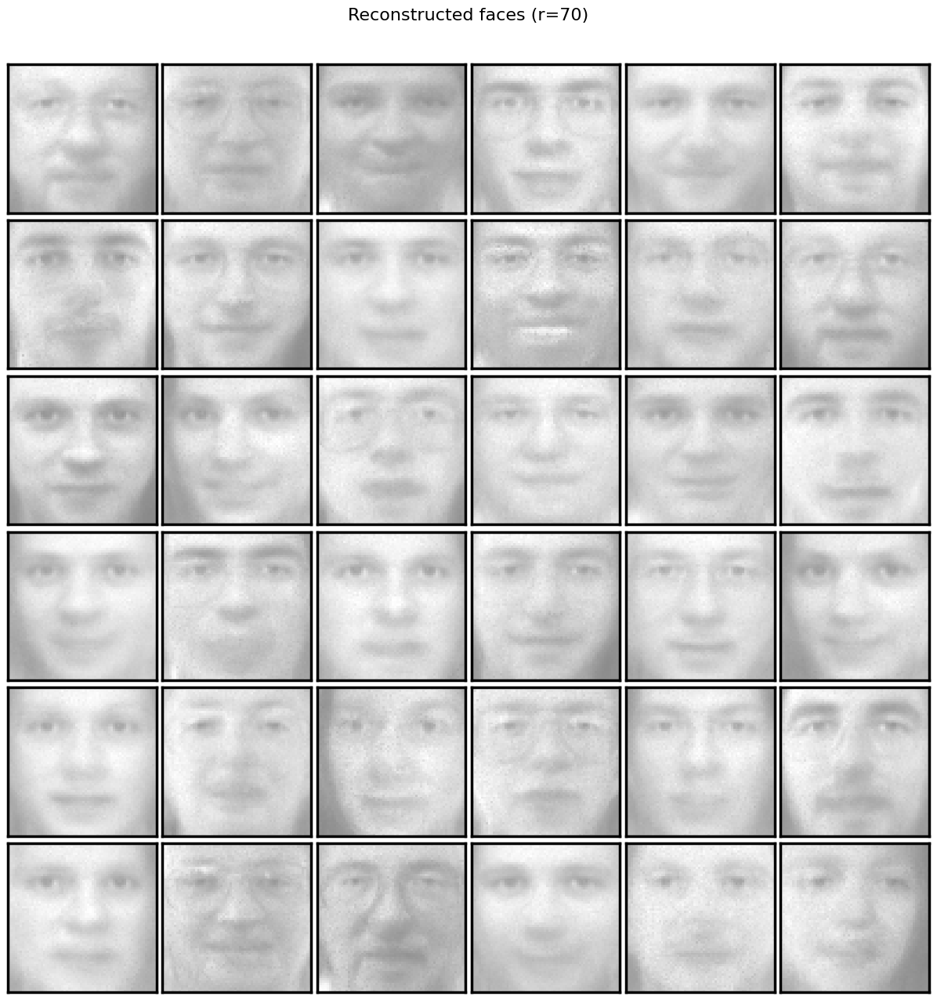

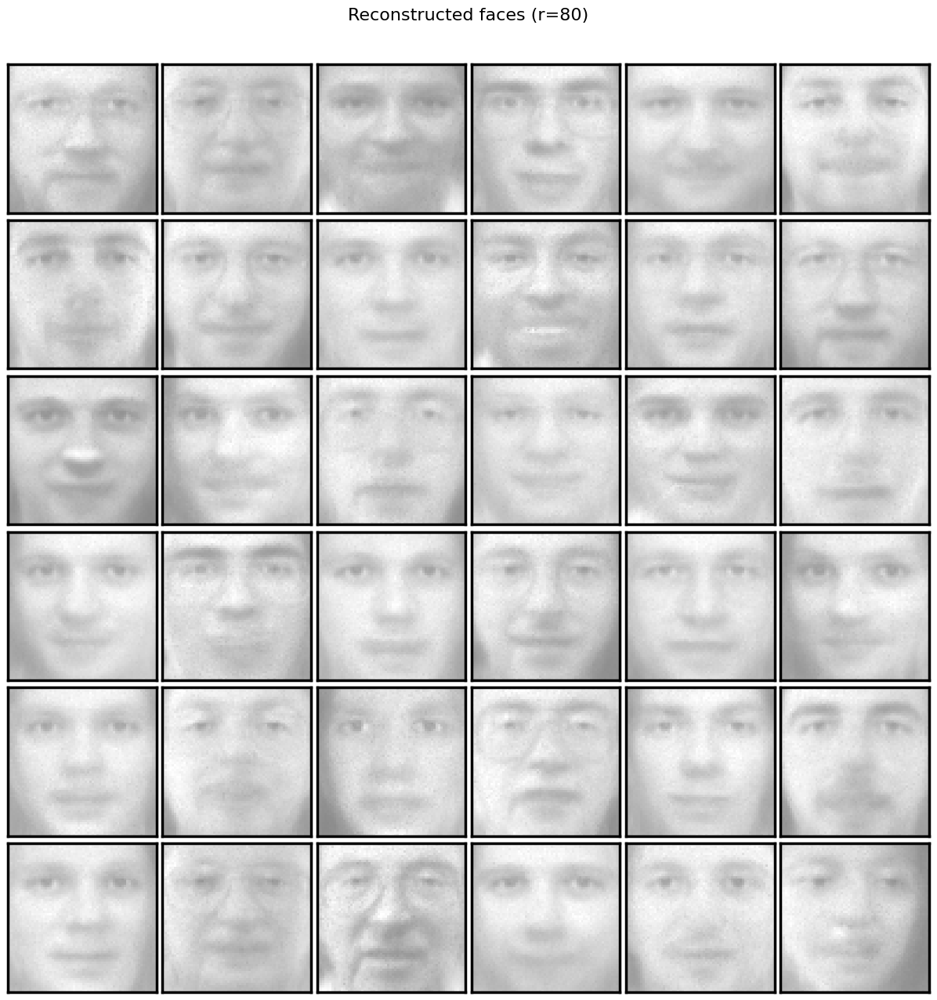

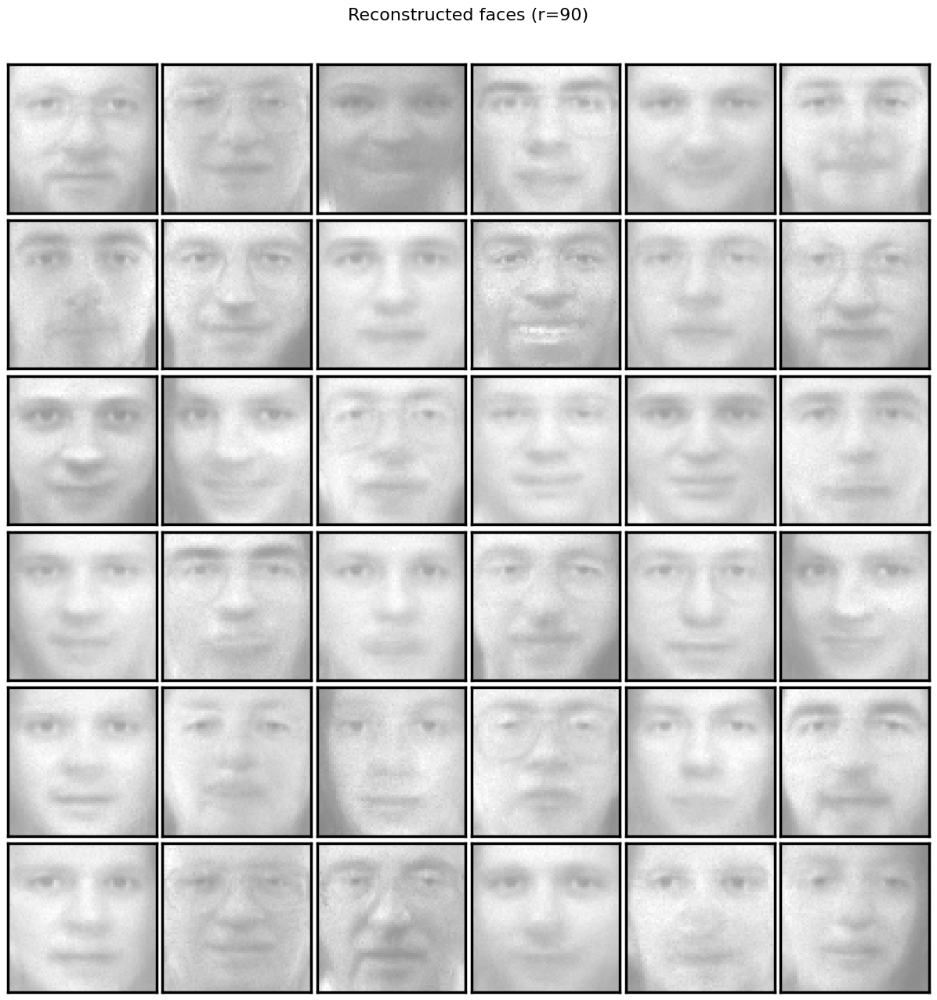

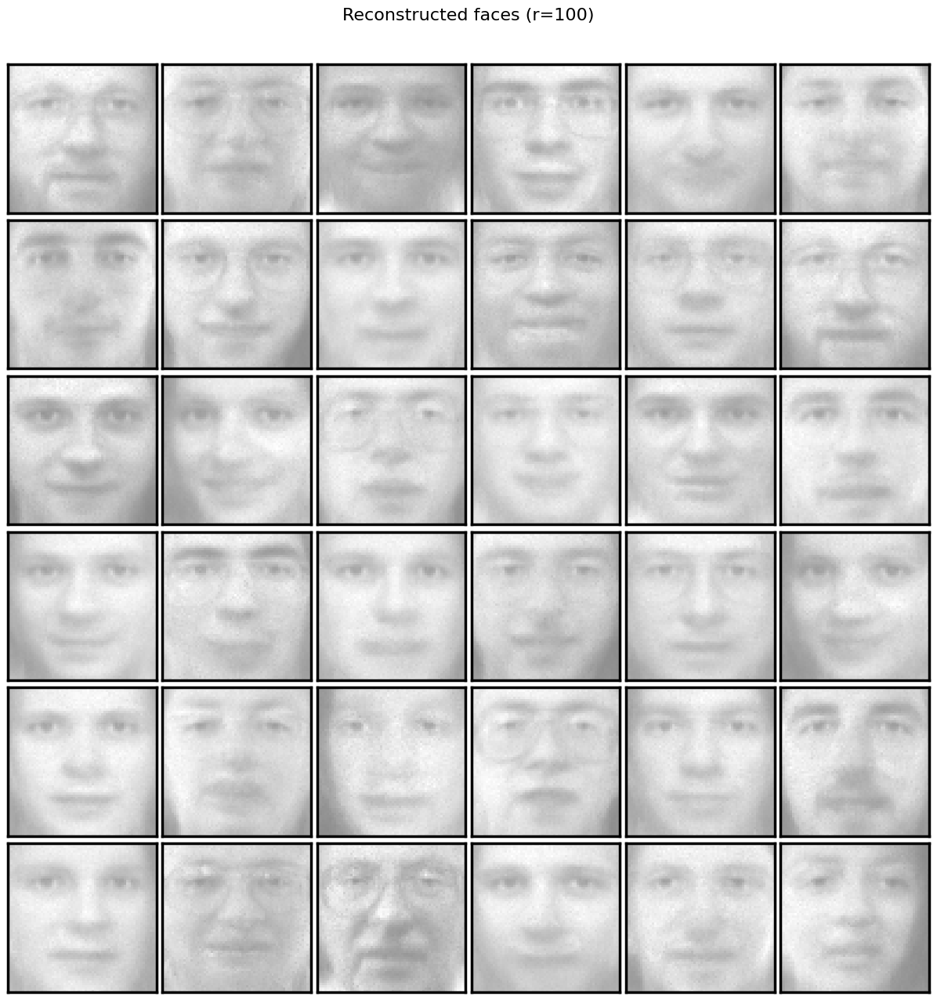

In [16]:
#TODO : plot reconstructed faces for different number of components with KL divergence

epochs = 100
r_grid = np.linspace(1, 100, 11, dtype=int)

for r in r_grid:
    opt = MYNMF(n_components=r, max_iter=epochs, loss="KL")
    opt.fit_transform(faces,lambd=best_ld, mu=best_mu, nu=best_nu)
    generated_faces = opt.D_ @ opt.S_
    

    plot_gallery(
        images=generated_faces[:36],                        
        image_shape=image_shape,
        nrow=6, ncol=6,
        title=f"Reconstructed faces (r={r})",
        cmap=plt.cm.gray
    )

#### Comparison of the elements of the dictionary between the two distances

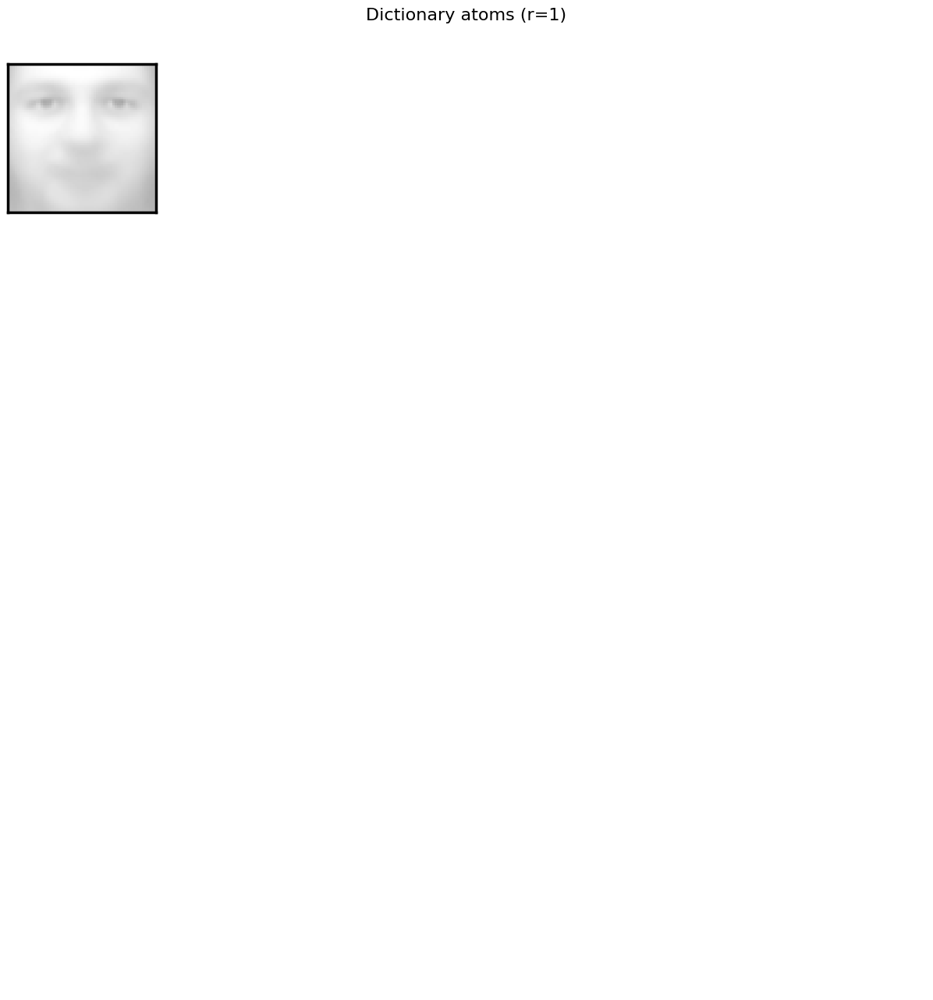

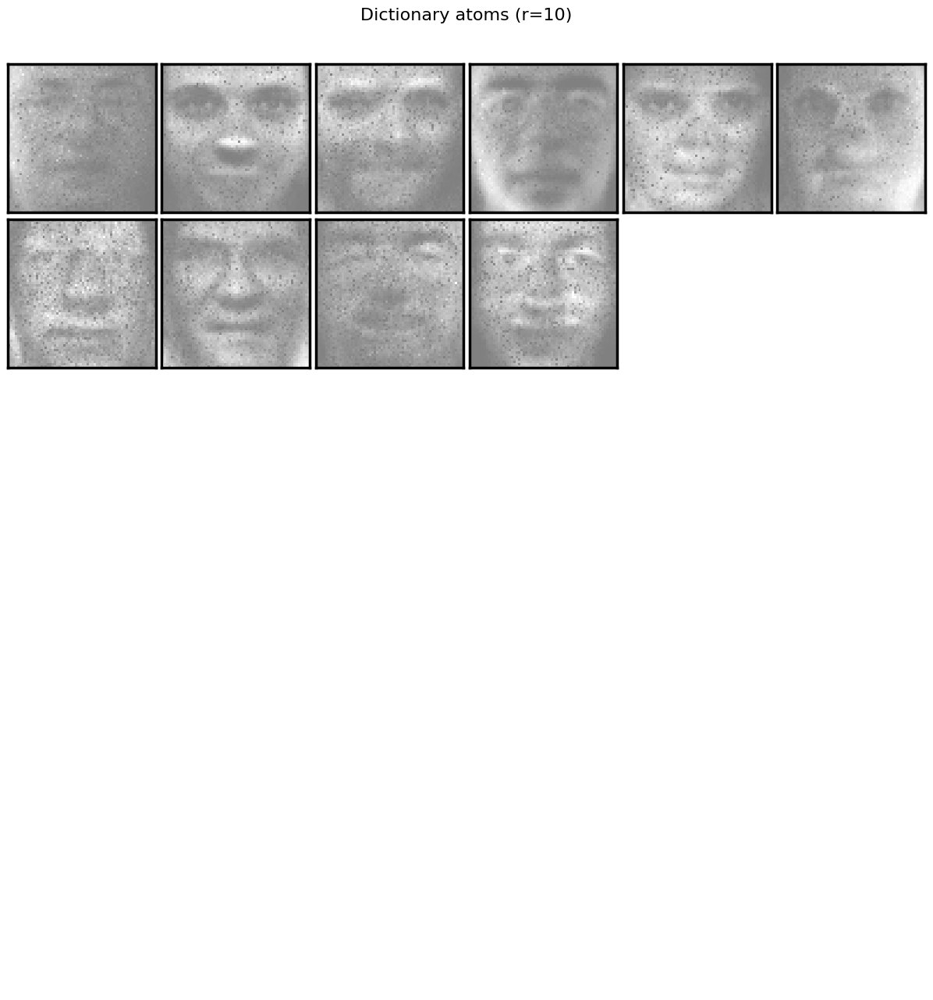

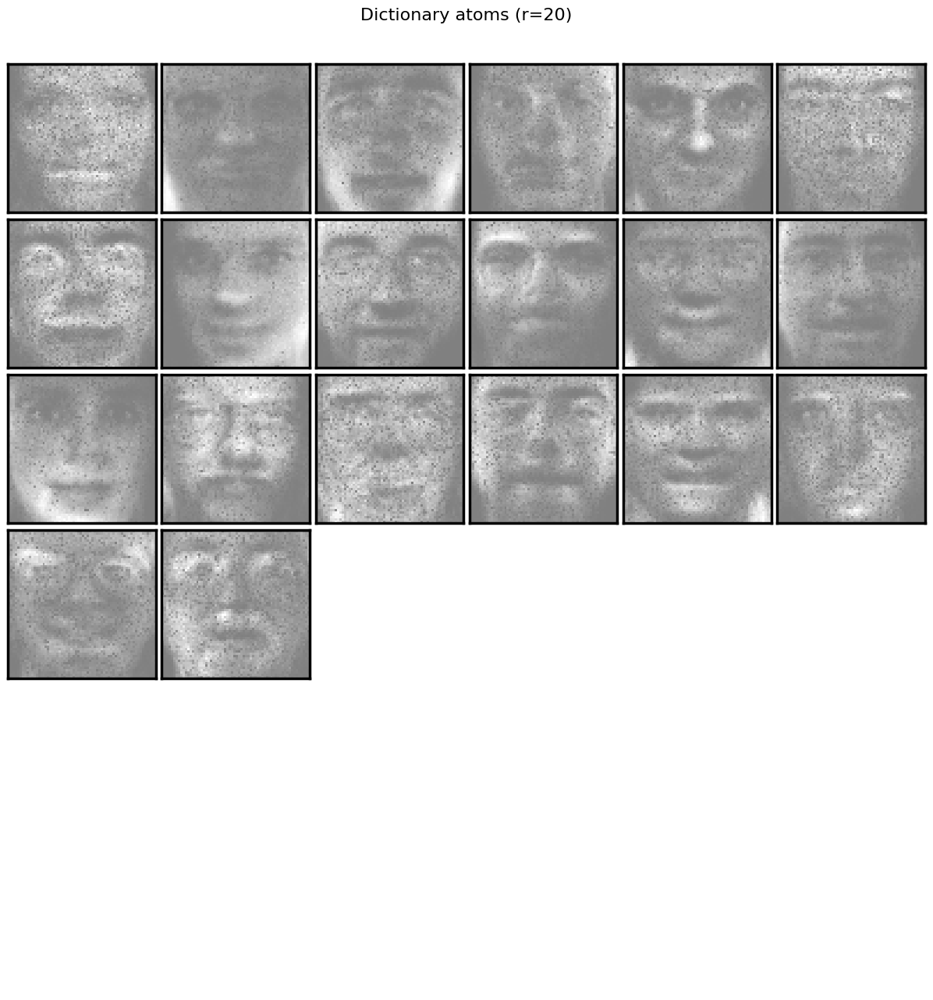

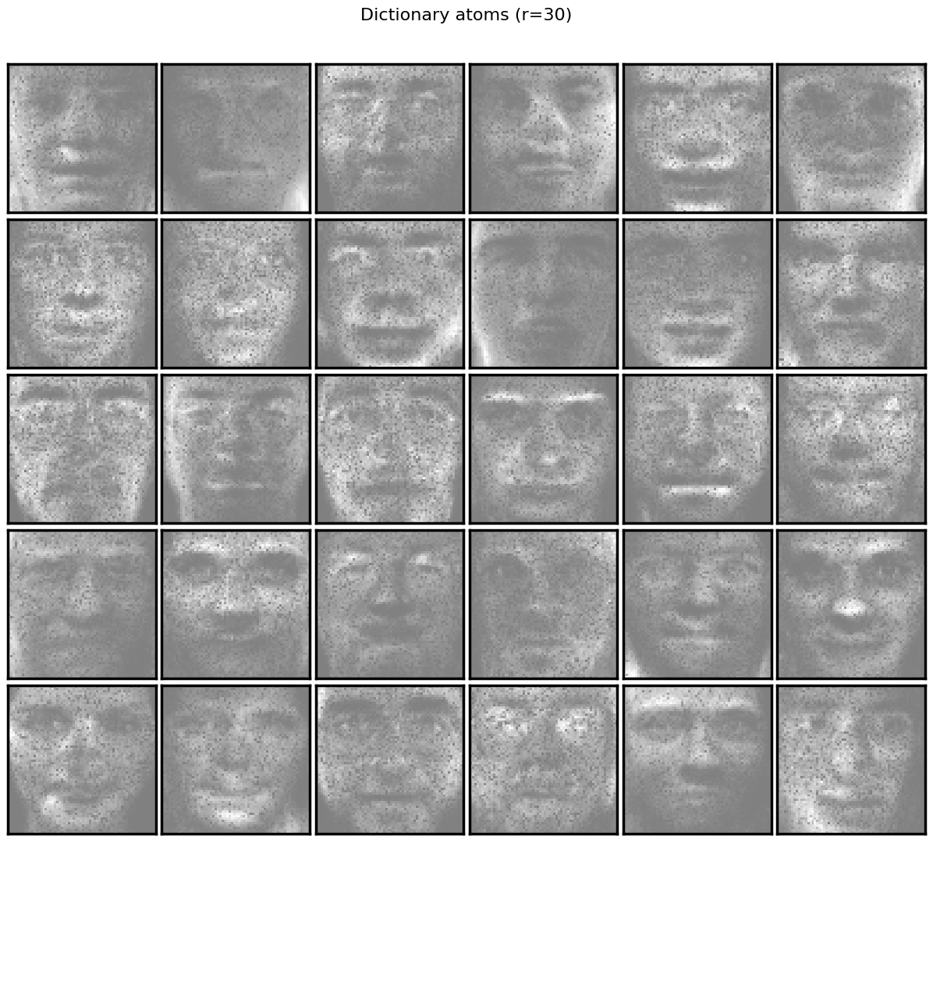

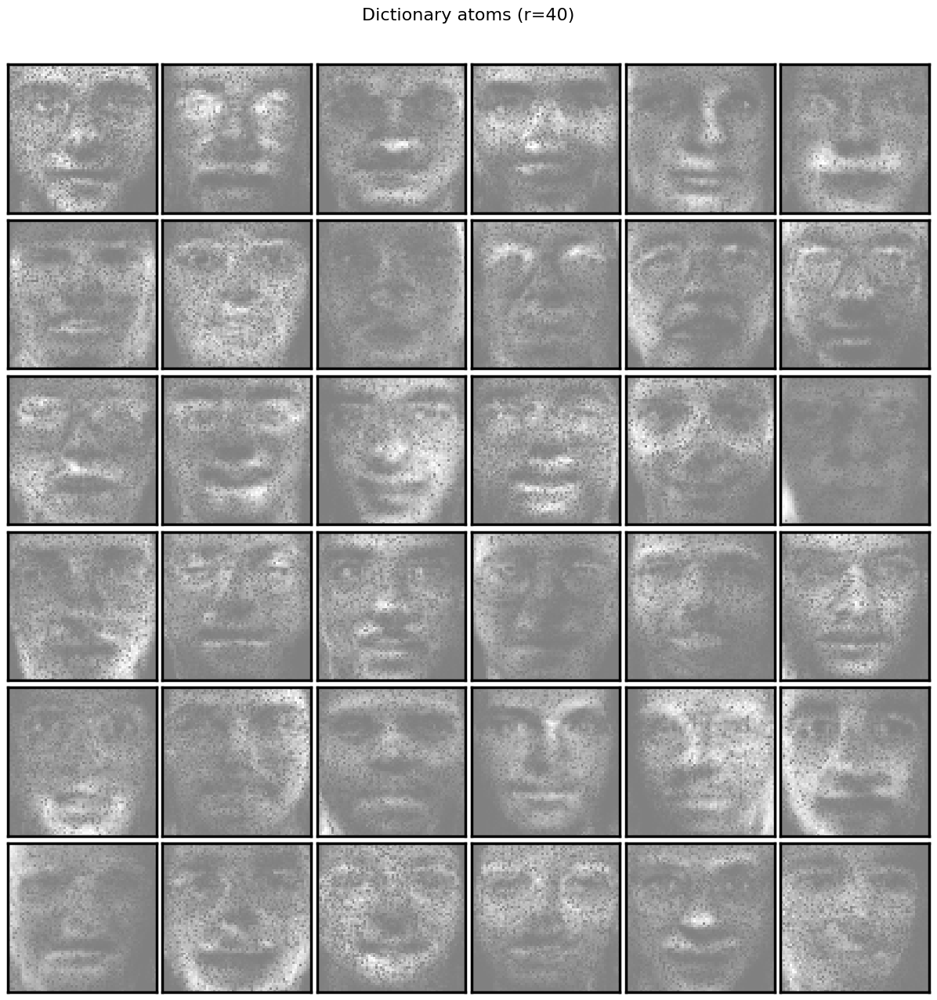

...

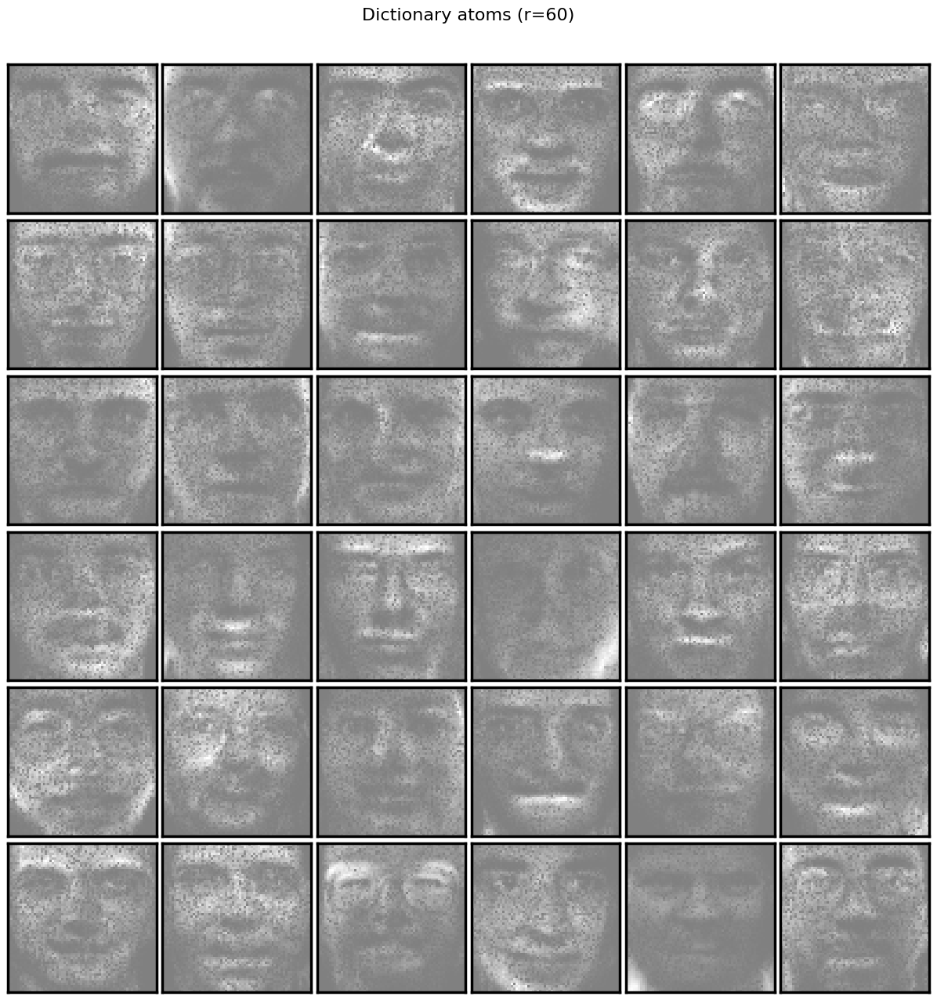

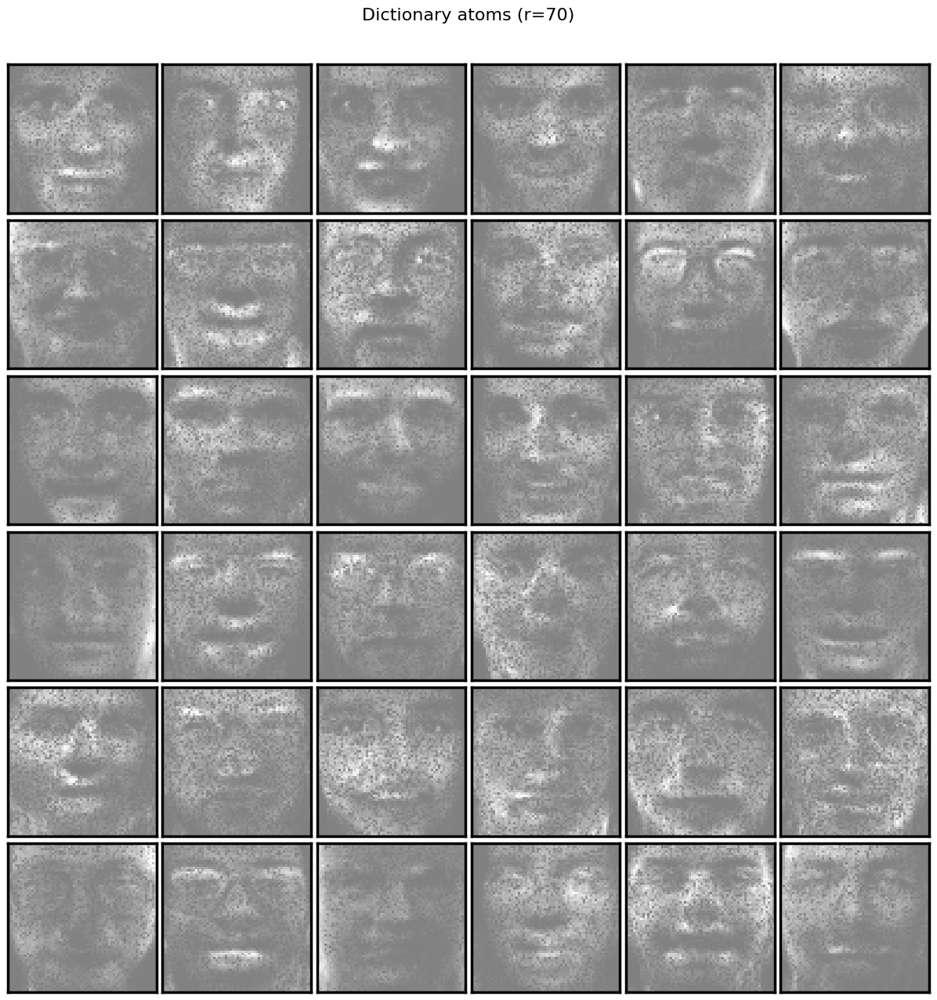

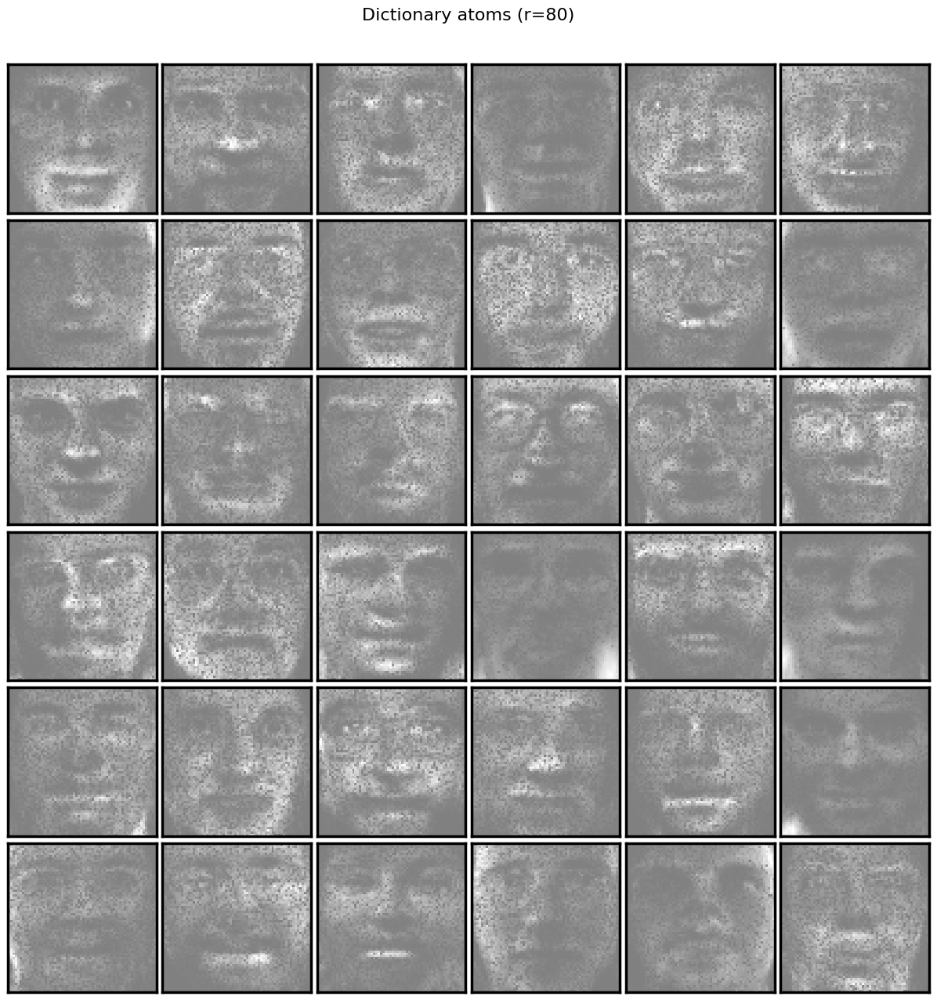

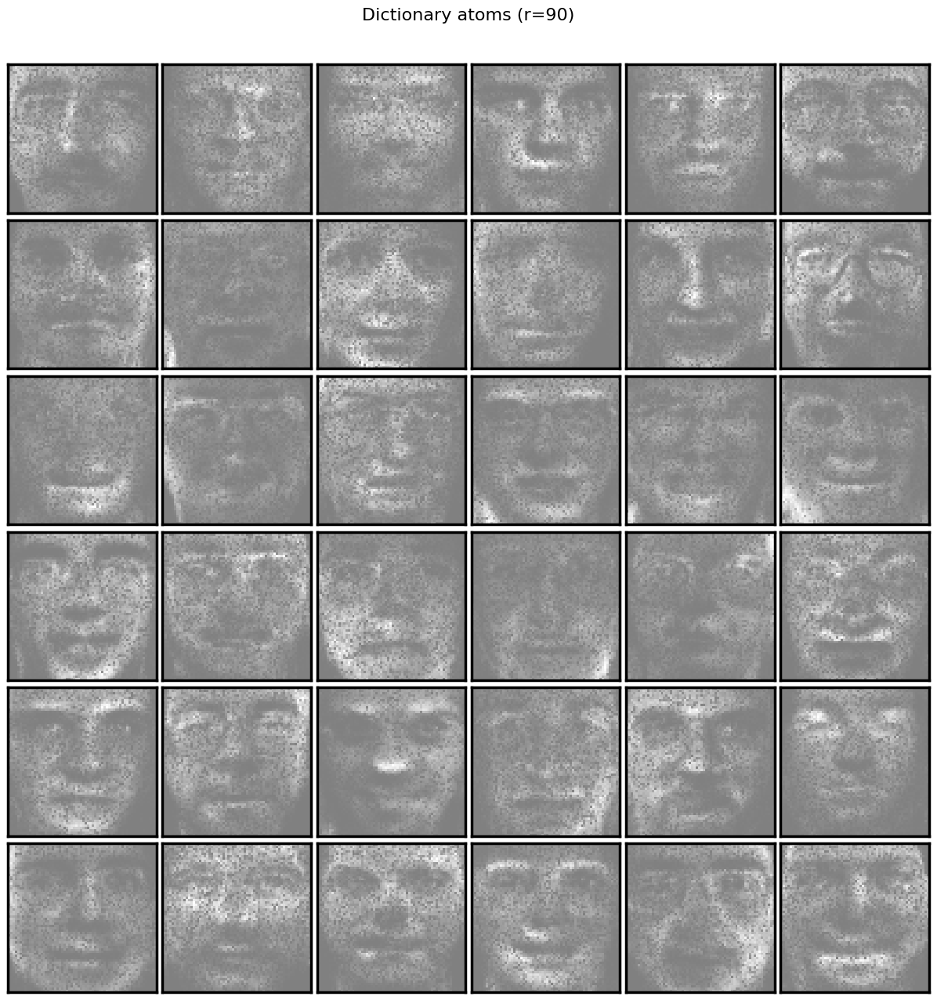

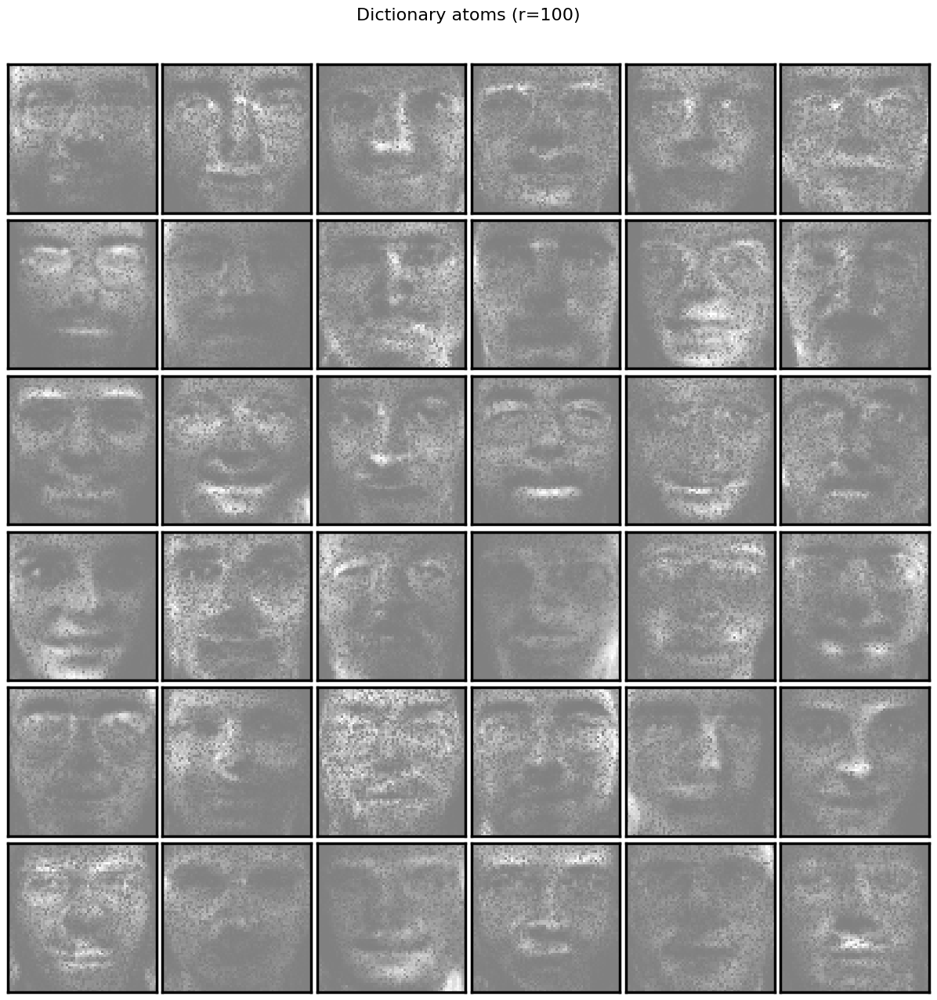

In [17]:
# TODO : plot the atoms of the dictionary for various number of components

epochs  = 100
r_grid  = np.linspace(1, 100, 11, dtype=int)
n_show  = 36

for r in r_grid:
    opt = MYNMF(n_components=r, max_iter=epochs, loss="Frobenius")
    opt.fit_transform(faces)

    S = opt.S_  
    row_norms = np.linalg.norm(S, axis=1, keepdims=True)
    S_disp = S / row_norms

    k = min(r, n_show)
    atoms_to_show = [S_disp[j, :] for j in range(k)]  

    plot_gallery(
        images=atoms_to_show,
        image_shape=image_shape,
        nrow=6, ncol=6,
        title=f"Dictionary atoms (r={r})",
        cmap=plt.cm.gray
    )


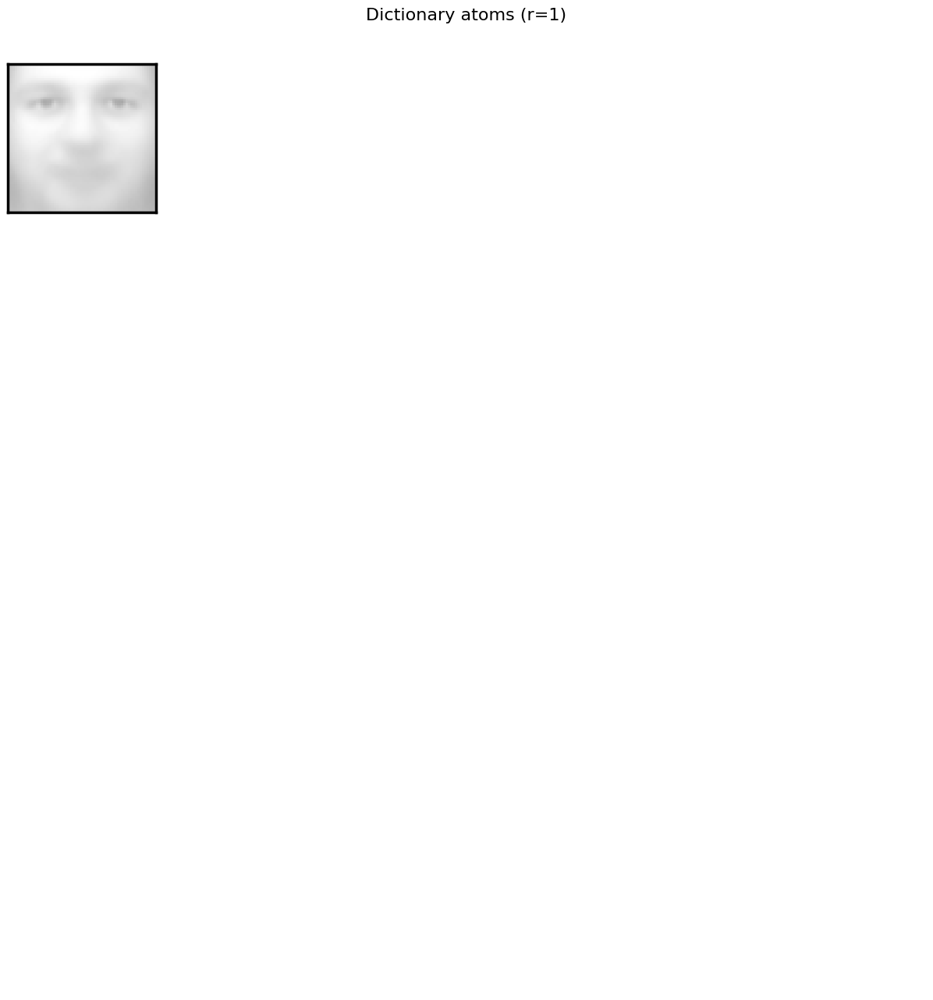

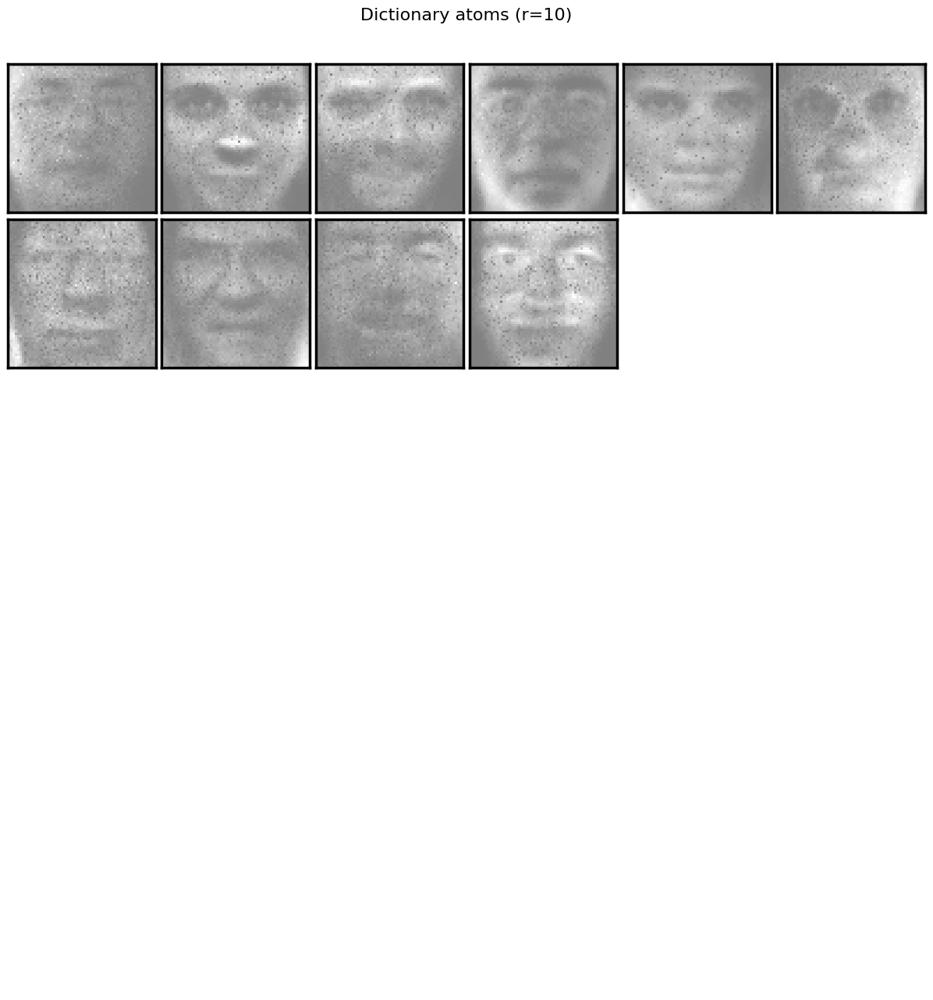

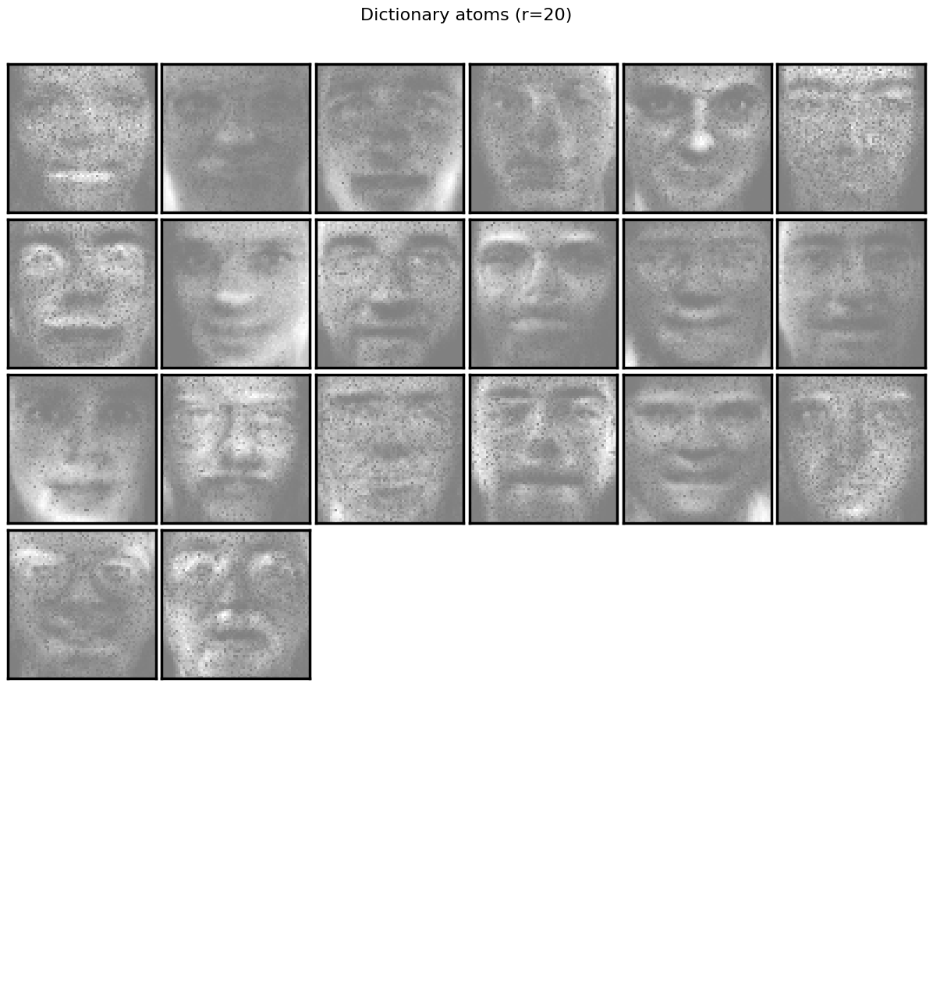

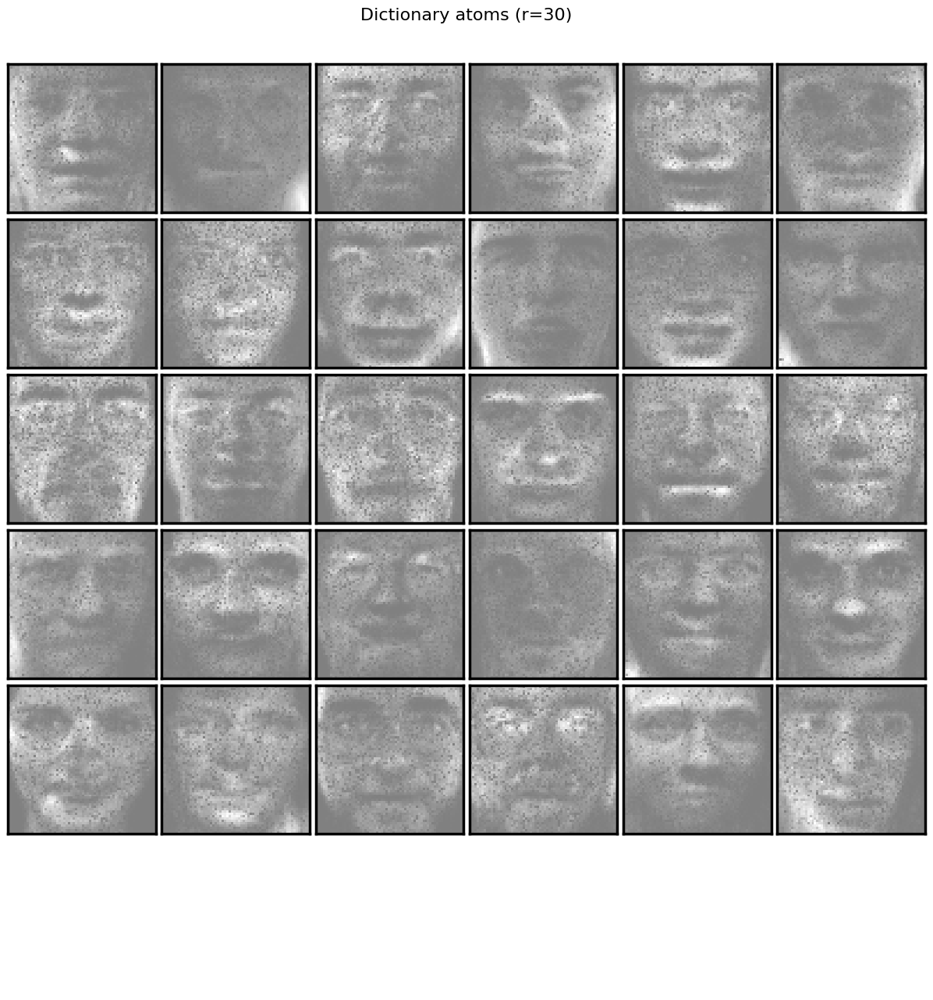

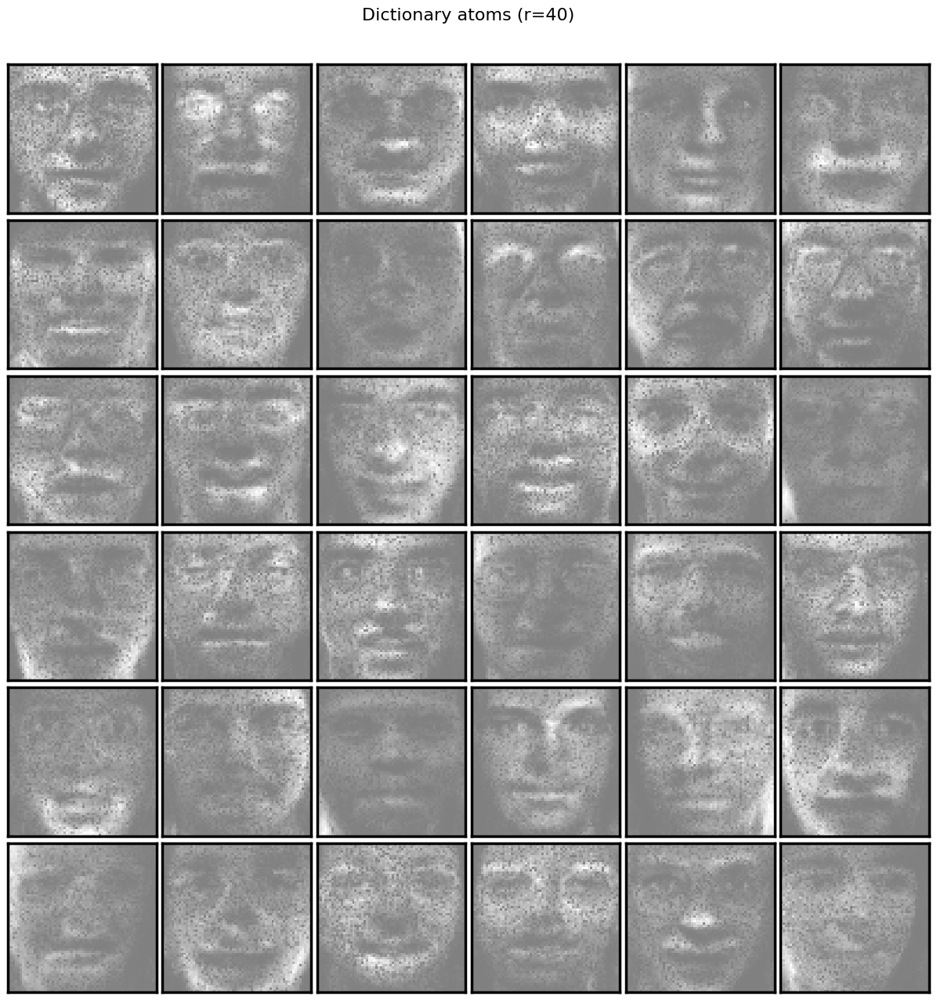

...

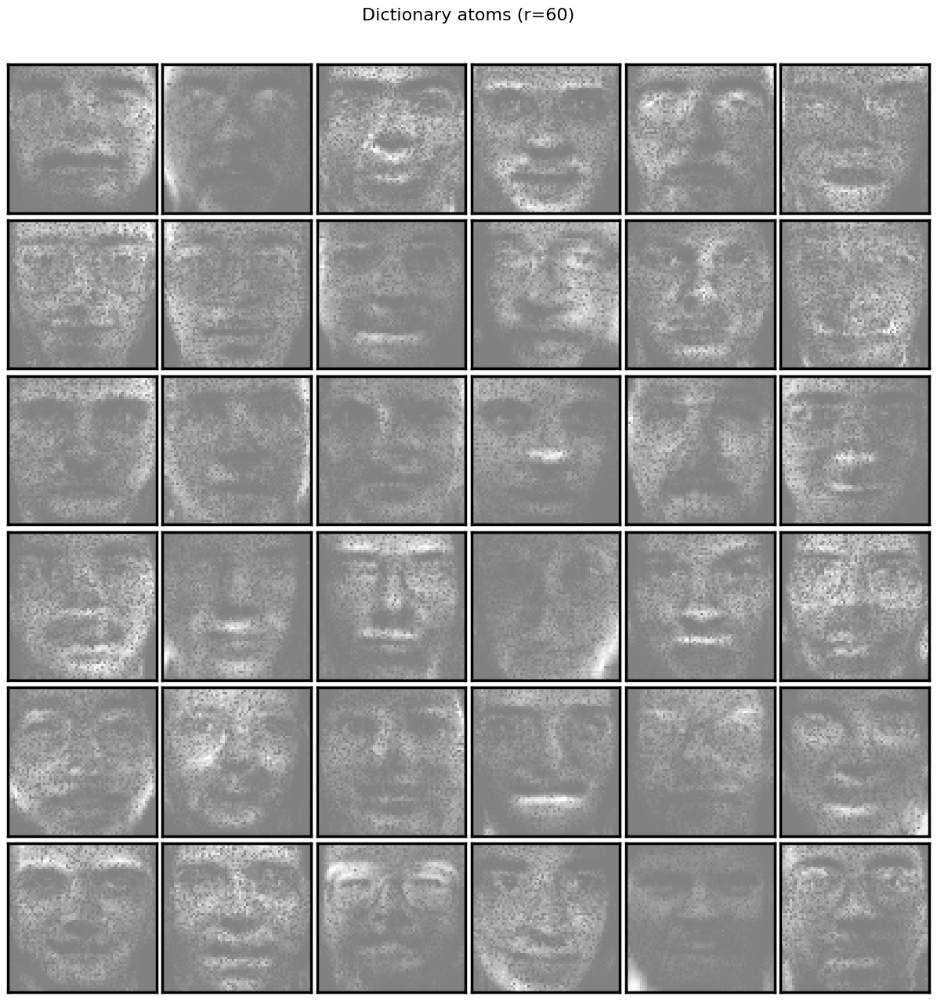

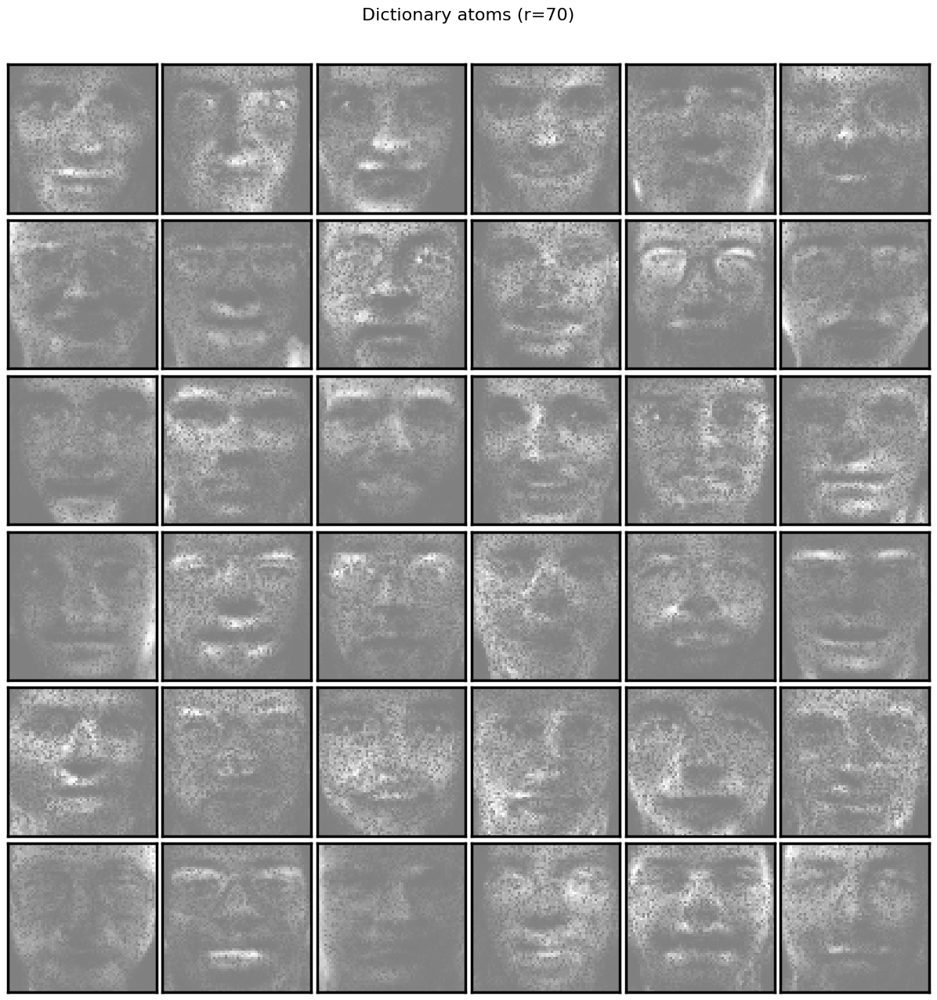

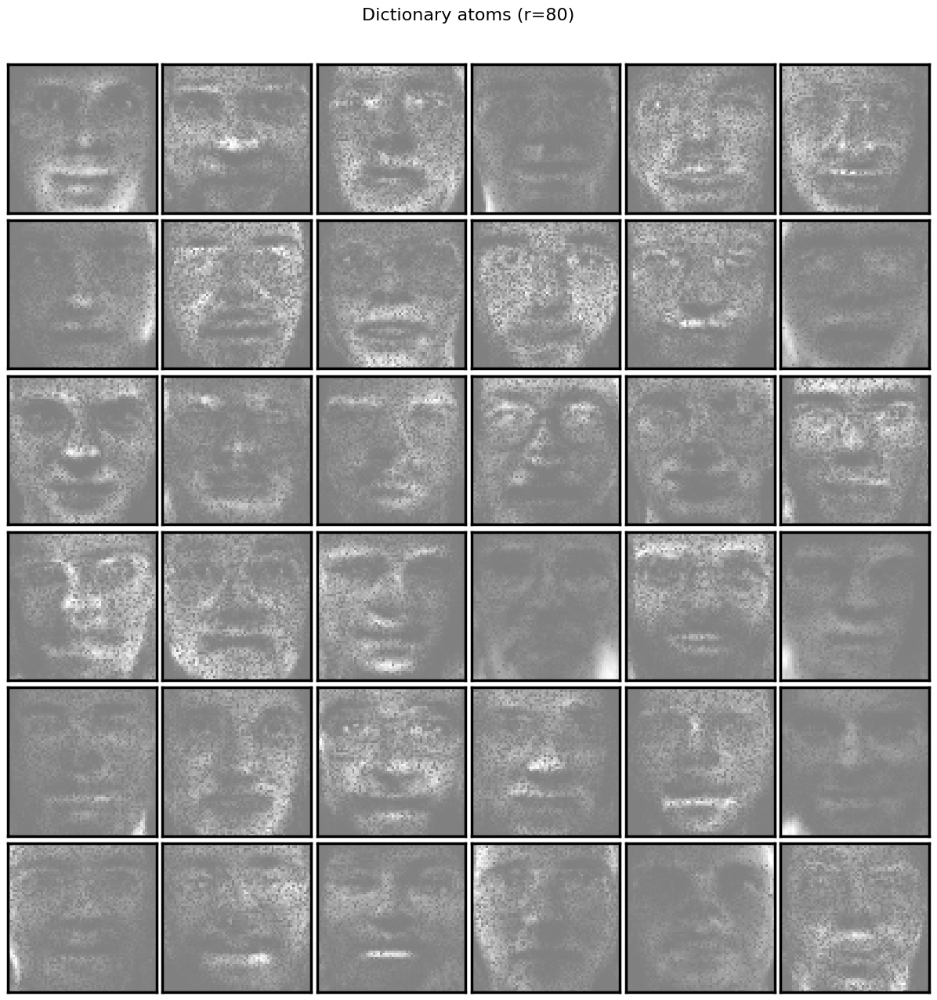

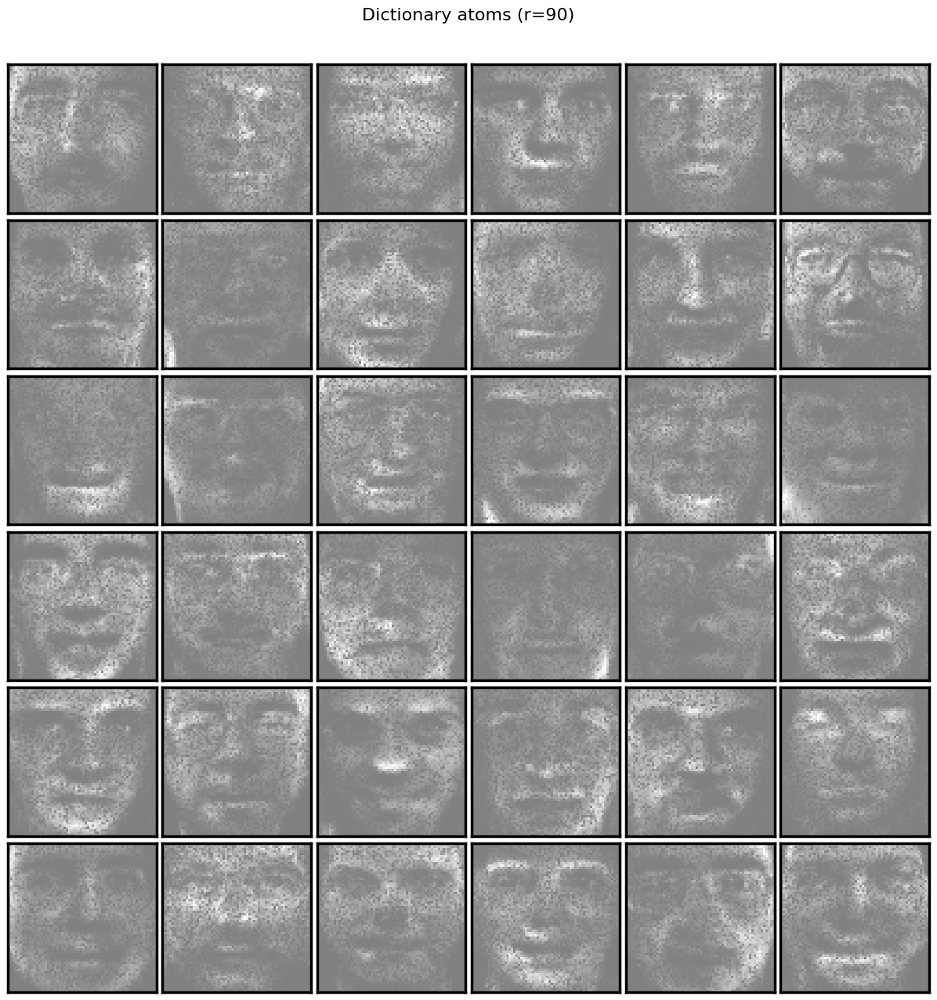

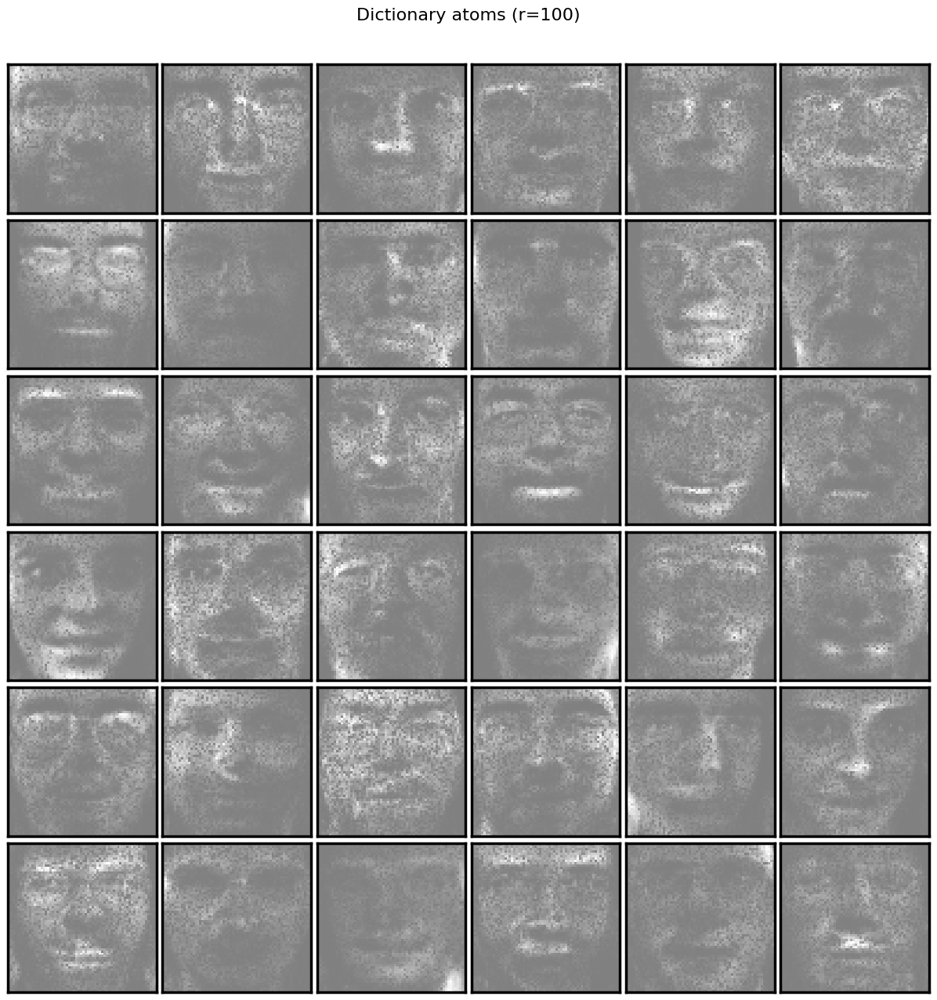

In [18]:
# TODO : plot the atoms of the dictionary for various number of components KL

epochs  = 100
r_grid  = np.linspace(1, 100, 11, dtype=int)
n_show  = 36

for r in r_grid:
    opt = MYNMF(n_components=r, max_iter=epochs, loss="KL")
    opt.fit_transform(faces)

    S = opt.S_  
    row_norms = np.linalg.norm(S, axis=1, keepdims=True)
    S_disp = S / row_norms

    k = min(r, n_show)
    atoms_to_show = [S_disp[j, :] for j in range(k)] 

    plot_gallery(
        images=atoms_to_show,
        image_shape=image_shape,
        nrow=6, ncol=6,
        title=f"Dictionary atoms (r={r})",
        cmap=plt.cm.gray
    )


### Study of the clustering for the Frobenius distance with 30 components

Now, we are going to clusterise the images in r different classes. First, we start by normalizing the norm of the dictionary elements, so that the euclidian norm = 1, and we multiply the associated row in the S matrix to preserve the factorization DS = X. Then, we find the highest coefficient for each image, and we use the index of the maximum as clustering label.

In [19]:
opt = MYNMF(n_components=30, max_iter=100, loss="KL")
opt.fit_transform(faces)
D = opt.D_.copy()  
S = opt.S_.copy()   

col_norms = np.linalg.norm(D, axis=0)               
D /= col_norms                                     
S *= col_norms[:, None]                             

labels = np.argmax(D, axis=1)                       

unique, counts = np.unique(labels, return_counts=True)
print(dict(zip(unique, counts)))


{0: 12, 1: 11, 2: 10, 3: 16, 4: 19, 5: 16, 6: 8, 7: 6, 8: 18, 9: 13, 10: 8, 11: 22, 12: 11, 13: 16, 14: 8, 15: 12, 16: 9, 17: 17, 18: 17, 19: 20, 20: 17, 21: 9, 22: 15, 23: 13, 24: 11, 25: 15, 26: 9, 27: 15, 28: 15, 29: 12}


## comment

The data are well balanced across the 30 clusters: counts range from 6 to 22 images (mean ≈13.3), with near-uniform usage. Larger clusters likely correspond to more generic components (e.g., global lighting/background) that activate for many images, whereas smaller clusters capture more specific patterns (pose/occlusion/hair).

### Second application 

Import the 20newsgroups dataset (from sklearn.datasets import fetch_20newsgroups_vectorized) that contains a collection of ~18,000 newsgroup documents from 20 different newsgroups.

Model the topics present in a subsample with *scikit-learn's* NMF. Print the most common words of each topic. 

Discuss.

In [21]:
# NMF topic modeling on a subsample of 20 Newsgroups
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import NMF

data = fetch_20newsgroups(subset="train", remove=("headers", "footers", "quotes")).data

vectorizer = TfidfVectorizer(max_df=0.95, min_df=2)
data_vect = vectorizer.fit_transform(data)

terms = np.array(vectorizer.get_feature_names_out())

r = 20
nmf = NMF(n_components=r,beta_loss="frobenius",max_iter=100)
nmf.fit_transform(data_vect) 
topn = 20

for k, comp in enumerate(nmf.components_):
    top_idx = np.argsort(comp)[::-1][:topn]
    print(f"Topic {k:02d}:", ", ".join(terms[top_idx]))


Topic 00: the, on, from, at, to, in, same, first, when, into, right, by, after, second, off, is, then, for, down, only
Topic 01: to, be, have, would, want, do, get, this, my, able, as, going, use, will, how, like, need, who, way, or
Topic 02: for, 00, sale, and, price, new, offer, looking, shipping, or, condition, car, 10, at, asking, am, sell, 50, with, used
Topic 03: he, his, him, and, said, has, didn, but, of, year, who, for, guy, hit, if, had, himself, did, got, good
Topic 04: you, your, if, do, can, re, don, what, are, have, think, know, about, see, get, ll, why, just, then, how
Topic 05: it, and, but, just, my, with, like, don, on, has, ve, so, up, can, about, doesn, if, out, at, well
Topic 06: is, this, there, not, what, are, as, no, in, an, which, if, one, question, true, or, test, only, but, so
Topic 07: geb, dsl, cadre, chastity, n3jxp, pitt, shameful, intellect, skepticism, surrender, gordon, banks, edu, soon, too, it, is, the, of, to
Topic 08: me, please, mail, thanks, if, 

/usr/local/lib/python3.11/dist-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 100 reached. Increase it to improve convergence.
  warnings.warn(


## comment
The model looks to be working well: the learned topics are coherent and map cleanly to expected 20 Newsgroups themes (Computer science, national security, politics, religion, sports, science), which indicates a good, interpretable NMF factorization.